# Analyzing Yelp Reviews in Time Series

Previous studies analyzed the textual features of Yelp reviews.

We plan to look at the reviews in time series - also, we plan to investigate the user, location, and photo data associated with reviews/businesses. 

The enhancements/contributions of this study includes:
    1. Review - time
    2. Reviewer - social network, expertise
    3. Location - safety, ...
    4. Photos - counts, contents

## Import Required Packages

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
import textblob as tb

## Reading Data

In [2]:
review_df = pd.read_csv('./data/yelp_review.csv')
business_df = pd.read_csv('./data/yelp_business.csv')

## Adding Names of Businesses to Reviews

In [3]:
business_df.columns

Index(['business_id', 'name', 'neighborhood', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'stars', 'review_count',
       'is_open', 'categories'],
      dtype='object')

In [4]:
name_df = business_df[['business_id', 'name']]
name_df.head()

,business_id,name
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design"""
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon"""
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle"""
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority"""
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap"""


In [5]:
named_review_df = pd.merge(review_df, name_df, how = 'left', left_on = 'business_id', right_on = 'business_id')
named_review_df.head()

,review_id,user_id,business_id,stars,date,text,useful,funny,cool,name
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0,"""Wilensky's"""
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0,"""Tuck Shop"""
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0,"""Lester's Deli"""
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0,"""Five Guys"""
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0,"""Maison Christian Faure"""


In [6]:
named_review_df['date'] = pd.to_datetime(named_review_df['date'])

In [7]:
named_review_df.set_index(['business_id', 'date'], inplace=True)
named_review_df.sort_index(inplace=True)
named_review_df.head()

review_id  \
business_id            date                                 
--6MefnULPED_I942VcFNA 2008-08-07  iT5SDn-i-L2NLMcdyERj0A   
                       2010-11-25  aKl1rH7HTkD0stonJP4YHg   
                       2010-12-06  hPsTqtjMSde_-v6ZZJiTVw   
                       2010-12-22  R8Q9mgL2cWgD5yn9_IA--g   
                       2011-01-08  s_DQ0OqFZ3a_8MgeU6Sh2w   

                                                  user_id  stars  \
business_id            date                                        
--6MefnULPED_I942VcFNA 2008-08-07  DS0Idr2XDhz5e7ZfSy0dYA      5   
                       2010-11-25  cPQZQGC_Rb6-xzKouHwT3w      4   
                       2010-12-06  j97y1ZAsYABIOcR0KQCy5Q      1   
                       2010-12-22  CxDOIDnH8gp9KXzpBHJYXw      2   
                       2011-01-08  mKemb3MpSyUbsVUVSmI5tg      3   

                                                                                text  \
business_id            date                                                            
--6MefnULPED_I942VcFNA 2008-08-07  Chinese name of this place, Canto pronounciati...   
                       2010-11-25  If you want a quick fix for a scrumptious char...   
                       2010-12-06  In the ultra competitive Chinese restaurant in...   
                       2010-12-22  John's Chinese BBQ Restaurant is one of those ...   
                       2011-01-08  i like humble-pie.\nbut the owner walks around...   

                                   useful  funny  cool  \
business_id            date                              
--6MefnULPED_I942VcFNA 2008-08-07       8      8     7   
                       2010-11-25       4      1     5   
                       2010-12-06       6      1     2   
                       2010-12-22       2      2     2   
                       2011-01-08       0      0     0   

                                                              name  
business_id            date                                         
--6MefnULPED_I942VcFNA 2008-08-07  "John's Chinese BBQ Restaurant"  
                       2010-11-25  "John's Chinese BBQ Restaurant"  
                       2010-12-06  "John's Chinese BBQ Restaurant"  
                       2010-12-22  "John's Chinese BBQ Restaurant"  
                       2011-01-08  "John's Chinese BBQ Restaurant"

In [8]:
sorted_review_df = named_review_df.sort_index(axis=0, level=['business_id', 'date'])
sorted_review_df.head(10)

review_id  \
business_id            date                                 
--6MefnULPED_I942VcFNA 2008-08-07  iT5SDn-i-L2NLMcdyERj0A   
                       2010-11-25  aKl1rH7HTkD0stonJP4YHg   
                       2010-12-06  hPsTqtjMSde_-v6ZZJiTVw   
                       2010-12-22  R8Q9mgL2cWgD5yn9_IA--g   
                       2011-01-08  s_DQ0OqFZ3a_8MgeU6Sh2w   
                       2011-05-30  u_mdSqHHWW1M9Cd0AMy3qA   
                       2012-04-15  KLIkfx3aU0SR4XrNrD-wGA   
                       2013-09-17  07sxoYCR6w9kn3z8O4ci7Q   
                       2014-01-29  8nQoAAtTpbohPwhc-8OB-w   
                       2014-08-15  -PGlmfPdd5UJM-WuRWgJGA   

                                                  user_id  stars  \
business_id            date                                        
--6MefnULPED_I942VcFNA 2008-08-07  DS0Idr2XDhz5e7ZfSy0dYA      5   
                       2010-11-25  cPQZQGC_Rb6-xzKouHwT3w      4   
                       2010-12-06  j97y1ZAsYABIOcR0KQCy5Q      1   
                       2010-12-22  CxDOIDnH8gp9KXzpBHJYXw      2   
                       2011-01-08  mKemb3MpSyUbsVUVSmI5tg      3   
                       2011-05-30  1kNsEAhGU8d8xugMuXJGFA      3   
                       2012-04-15  Tc3GAQdAfOW542ROdyCZPg      3   
                       2013-09-17  HSHuSCJvIvf_Tof62uZPEw      3   
                       2014-01-29  h7BVaXP8quy7TlxmHkzOKw      2   
                       2014-08-15  mcq1qdkjI7M-E1BXeFXstg      4   

                                                                                text  \
business_id            date                                                            
--6MefnULPED_I942VcFNA 2008-08-07  Chinese name of this place, Canto pronounciati...   
                       2010-11-25  If you want a quick fix for a scrumptious char...   
                       2010-12-06  In the ultra competitive Chinese restaurant in...   
                       2010-12-22  John's Chinese BBQ Restaurant is one of those ...   
                       2011-01-08  i like humble-pie.\nbut the owner walks around...   
                       2011-05-30  Expensive...?\n\nI've never been to a place wh...   
                       2012-04-15  This place is a favourite lunch spot for my fa...   
                       2013-09-17  If you're a true Chinese food enthusiast, you'...   
                       2014-01-29  The BBQ meats here are the only items I find e...   
                       2014-08-15  Good quality Chinese food.  Decor is nice for ...   

                                   useful  funny  cool  \
business_id            date                              
--6MefnULPED_I942VcFNA 2008-08-07       8      8     7   
                       2010-11-25       4      1     5   
                       2010-12-06       6      1     2   
                       2010-12-22       2      2     2   
                       2011-01-08       0      0     0   
                       2011-05-30       1      0     1   
                       2012-04-15       0      0     1   
                       2013-09-17       1      1     0   
                       2014-01-29       2      0     1   
                       2014-08-15       0      0     0   

                                                              name  
business_id            date                                         
--6MefnULPED_I942VcFNA 2008-08-07  "John's Chinese BBQ Restaurant"  
                       2010-11-25  "John's Chinese BBQ Restaurant"  
                       2010-12-06  "John's Chinese BBQ Restaurant"  
                       2010-12-22  "John's Chinese BBQ Restaurant"  
                       2011-01-08  "John's Chinese BBQ Restaurant"  
                       2011-05-30  "John's Chinese BBQ Restaurant"  
                       2012-04-15  "John's Chinese BBQ Restaurant"  
                       2013-09-17  "John's Chinese BBQ Restaurant"  
                       2014-01-29  "John's Chinese BBQ

In [9]:
# Count # of reviews for each business
review_counts = named_review_df.reset_index().groupby(['business_id'])['text'].nunique()
type(review_counts)

pandas.core.series.Series

In [10]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 8)

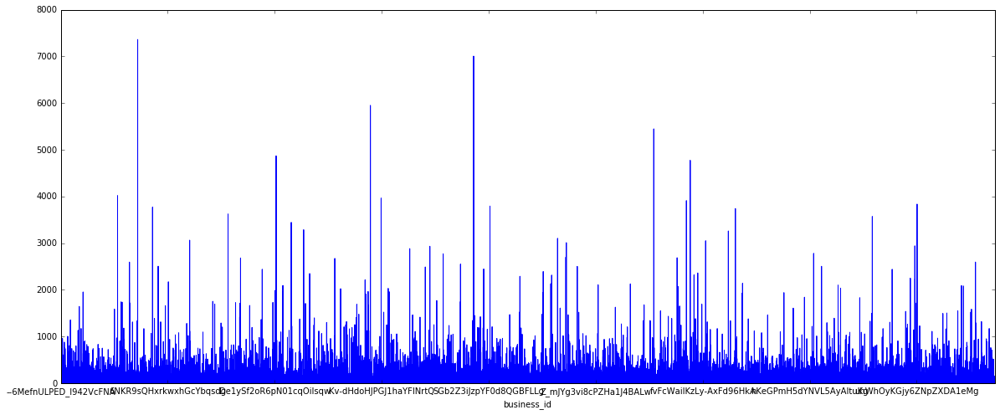

In [11]:
#reviews = review_counts.cumsum()
review_counts.plot()

In [12]:
review_counts[review_counts > 1000].shape

(241,)

There are 241 businesses have more than 1000 reviews in the time frame.

In [13]:
review_counts[review_counts > 500].shape

(924,)

There are 924 businesses have more than 1000 reviews in the time frame.

In [14]:
review_counts.idxmax()

'4JNXUYY8wbaaDmk3BPzlWw'

In [15]:
review_counts.max()

7362

In [16]:
review_counts['4JNXUYY8wbaaDmk3BPzlWw']

7362

In [17]:
sorted_review_df.ix['4JNXUYY8wbaaDmk3BPzlWw']

,review_id,user_id,stars,text,useful,funny,cool,name
date,,,,,,,,
2005-10-10,ojCMmtgJPvw6yaIDpUYZmw,qEYG5IE5dTekjIhdoV31bQ,5,If you enjoy a little people watching with you...,0,0,0,"""Mon Ami Gabi"""
2005-10-15,diaVB93Is7yYD-ajYQKvqw,k2zuwaAne-FhHd8M6bXnyQ,5,"affordable, fairly classic french food\n\nsit ...",2,2,2,"""Mon Ami Gabi"""
2005-12-02,6HswqFO2yndpRGCe2gIAwg,gjhzKWsqCIrpEd9pevbKZw,4,Though heartbroken and a bit aimless on my 22n...,3,2,3,"""Mon Ami Gabi"""
2006-01-07,d2IvFpPFBs6trRqVkqyjbg,8-lLoii2bEEB_IDJlryyDw,4,"The food and wine was amazing, but the super h...",1,0,0,"""Mon Ami Gabi"""
2006-01-31,M99598wD-2oEQhGru_GvEQ,_W4y7ku6Q0uGoiI3ePtkgQ,5,Yippy! Make-your-own bloody mary bar! Chose t...,0,1,0,"""Mon Ami Gabi"""
2006-04-23,0B2yPLHAs2bRoRgaMjqKLw,kxGmX1lBXJAv-4mI_QduWg,4,I went here for a team function on one of the ...,2,0,1,"""Mon Ami Gabi"""
2006-05-11,Es9BZoK6GFVA5yC9wsP3zw,HiN8a5gtHhwAY2rWrrRy1w,5,My best friend took me here after she had a go...,0,0,0,"""Mon Ami Gabi"""
2006-05-16,pTQ2norBkKMqJH4qZrVKWA,iYzbRy7B_Ho3NX-1rXvRLQ,3,"An affordable dining experience in Paris, I me...",0,0,0,"""Mon Ami Gabi"""
2006-05-17,i00GSK_taJeWFOL-NKJxaw,j8aF-ZCiSfKySt00chEeyQ,5,Definitely one of my favorites on the Strip! I...,0,0,0,"""Mon Ami Gabi"""


In [18]:
MAG_df = sorted_review_df.ix['4JNXUYY8wbaaDmk3BPzlWw']

In [19]:
MAG_df.head()

,review_id,user_id,stars,text,useful,funny,cool,name
date,,,,,,,,
2005-10-10,ojCMmtgJPvw6yaIDpUYZmw,qEYG5IE5dTekjIhdoV31bQ,5,If you enjoy a little people watching with you...,0,0,0,"""Mon Ami Gabi"""
2005-10-15,diaVB93Is7yYD-ajYQKvqw,k2zuwaAne-FhHd8M6bXnyQ,5,"affordable, fairly classic french food\n\nsit ...",2,2,2,"""Mon Ami Gabi"""
2005-12-02,6HswqFO2yndpRGCe2gIAwg,gjhzKWsqCIrpEd9pevbKZw,4,Though heartbroken and a bit aimless on my 22n...,3,2,3,"""Mon Ami Gabi"""
2006-01-07,d2IvFpPFBs6trRqVkqyjbg,8-lLoii2bEEB_IDJlryyDw,4,"The food and wine was amazing, but the super h...",1,0,0,"""Mon Ami Gabi"""
2006-01-31,M99598wD-2oEQhGru_GvEQ,_W4y7ku6Q0uGoiI3ePtkgQ,5,Yippy! Make-your-own bloody mary bar! Chose t...,0,1,0,"""Mon Ami Gabi"""


In [20]:
MAG_df.groupby('name').review_id.nunique()

name
"Mon Ami Gabi"    7362
Name: review_id, dtype: int64

In [21]:
MAG_df.index.dtype

dtype('<M8[ns]')

In [22]:
MAG_ts = MAG_df.reset_index().groupby(MAG_df.index.week)['review_id'].nunique()

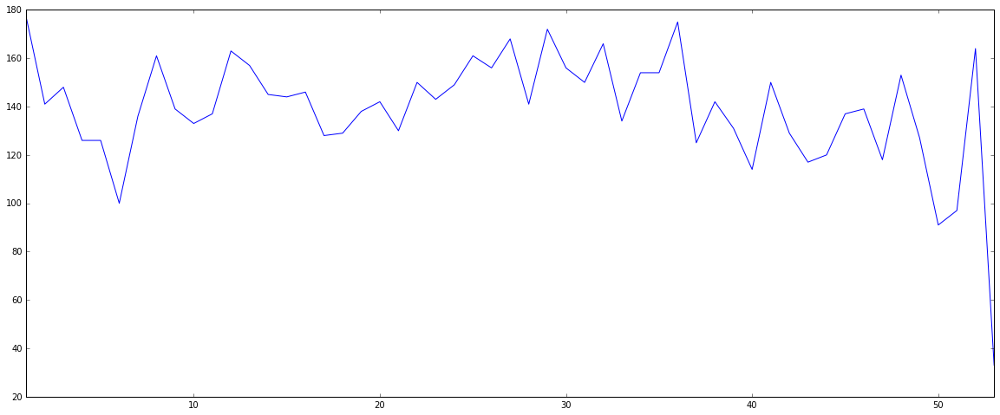

In [23]:
MAG_ts.plot()

Most of the months have more than 100 reviews. 

So we may treat each week as a corpus in the time series.

In [24]:
# Construct weekly corpus
MAG_reviews = MAG_df['text']
#MAG_reviews

In [25]:
print(MAG_reviews.resample('M').sum()[0])

If you enjoy a little people watching with your dining, sit out on the outside terrace and watch Las Vegas tourist walk the strip as they celebrate their winnings or rave about the fabulous Bellagio fountains.  As the restaurant is directly across from the fountains, it is also a great place to dine while taking in the free show.   The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.   We had excellent service..polite, prompt, helpful (great at helping us pick a great wine suited to our selections!) and personal.   And by the way,   the wait staff aren't above snapping that great snapshot of you and your guest having a good time....it is great to be a tourist!affordable, fairly classic french food

sit outside if you like to people watch

or 

see the bellagio fountain show

very reminiscent of paris
(on steroids!)


In [26]:
def my_resample(x):
    week_corpus = []
    week_corpus.append(x)
    return week_corpus

In [27]:
# print(MAG_reviews.resample('M').agg({'text' : ' + '.join}))

In [28]:
MAG_reviews_weekly = MAG_reviews.resample('M').sum()
MAG_reviews_weekly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
MAG_reviews_weekly.head()

date
2005-10-31    If you enjoy a little people watching with you...
2005-11-30                                                    0
2005-12-31    Though heartbroken and a bit aimless on my 22n...
2006-01-31    The food and wine was amazing, but the super h...
2006-02-28                                                    0
Freq: M, Name: text, dtype: object

In [29]:
MAG_weekly = MAG_reviews_weekly.str.split('  ')

In [30]:
len(MAG_weekly.ix['2005-10-31'])

6

In [31]:
len(MAG_weekly.ix['2009-12-31'])

30

In [32]:
MAG_weekly[0]

['If you enjoy a little people watching with your dining, sit out on the outside terrace and watch Las Vegas tourist walk the strip as they celebrate their winnings or rave about the fabulous Bellagio fountains.',
 'As the restaurant is directly across from the fountains, it is also a great place to dine while taking in the free show.',
 ' The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.',
 ' We had excellent service..polite, prompt, helpful (great at helping us pick a great wine suited to our selections!) and personal.',
 ' And by the way,',
 " the wait staff aren't above snapping that great snapshot of you and your guest having a good time....it is great to be a tourist!affordable, fairly classic french food\n\nsit outside if you like to people watch\n\nor \n\nsee the bellagio fountain show\n\nvery reminiscent of paris\n(on steroids!)"]

In [33]:
for row in MAG_weekly.loc[MAG_weekly.isnull()].index:
    MAG_weekly.at[row] = []

In [34]:
MAG_weekly

date
2005-10-31    [If you enjoy a little people watching with yo...
2005-11-30                                                   []
2005-12-31    [Though heartbroken and a bit aimless on my 22...
2006-01-31    [The food and wine was amazing, but the super ...
2006-02-28                                                   []
2006-03-31                                                   []
2006-04-30    [I went here for a team function on one of the...
2006-05-31    [My best friend took me here after she had a g...
2006-06-30    [What great friends I have..... We ate at Mon ...
2006-07-31    [Very good. There is a bunch of tourist trap b...
2006-08-31    [Mon Ami Gabi(Paris hotel) The restaurant is n...
2006-09-30    [Overall, a great restaurant! Not too overpric...
2006-10-31    [Slightly noisy but great food in Vegas at a v...
2006-11-30    [I love how many of my favorite restaurants in...
2006-12-31    [amazing french restaurant in the paris hotel....
2007-01-31    [Been to Las Vegas tw

In [35]:
MAG_weekly.apply(len)

date
2005-10-31      6
2005-11-30      0
2005-12-31      1
2006-01-31     13
2006-02-28      0
2006-03-31      0
2006-04-30      9
2006-05-31     23
2006-06-30     12
2006-07-31      1
2006-08-31     14
2006-09-30      3
2006-10-31      5
2006-11-30      6
2006-12-31      1
2007-01-31      8
2007-02-28     30
2007-03-31     20
2007-04-30     40
2007-05-31     17
2007-06-30     26
2007-07-31     31
2007-08-31     20
2007-09-30     38
2007-10-31     46
2007-11-30     12
2007-12-31     51
2008-01-31     16
2008-02-29     20
2008-03-31     55
             ... 
2015-07-31    226
2015-08-31     98
2015-09-30    143
2015-10-31    139
2015-11-30    115
2015-12-31     90
2016-01-31    124
2016-02-29    128
2016-03-31     95
2016-04-30    124
2016-05-31    112
2016-06-30     58
2016-07-31     84
2016-08-31     53
2016-09-30    195
2016-10-31    115
2016-11-30     82
2016-12-31    129
2017-01-31    132
2017-02-28    125
2017-03-31     98
2017-04-30    129
2017-05-31     91
2017-06-30     87
2017-

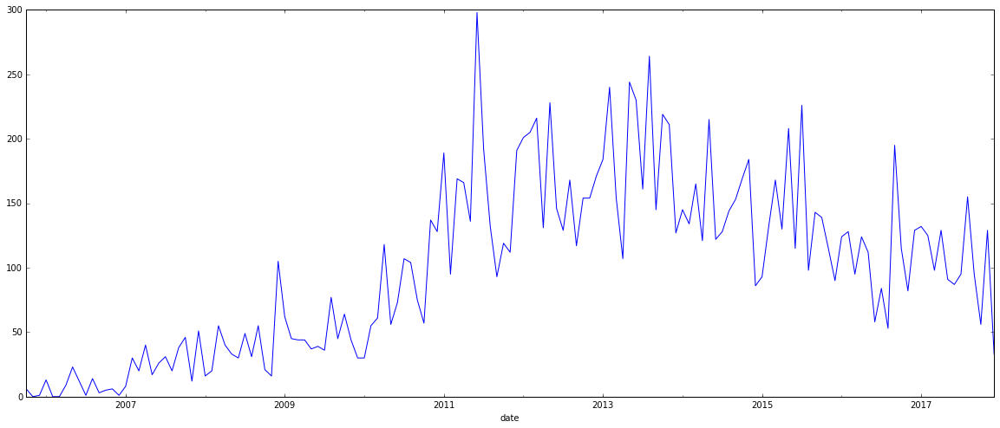

In [36]:
MAG_weekly.apply(len).plot()

Number of reviews monthly.

In [37]:
text = MAG_weekly.ix['2014-06-30']
length = 0
for t in text:
    length += len(t)

print(length/len(text))
print(length)

371.155737704918
45281


In [38]:
def rev_len(x):
    length = 0
    for t in x:
        length += len(t)
    if(len(x)==0):
        return(0)
    else:
        return(length/len(x))

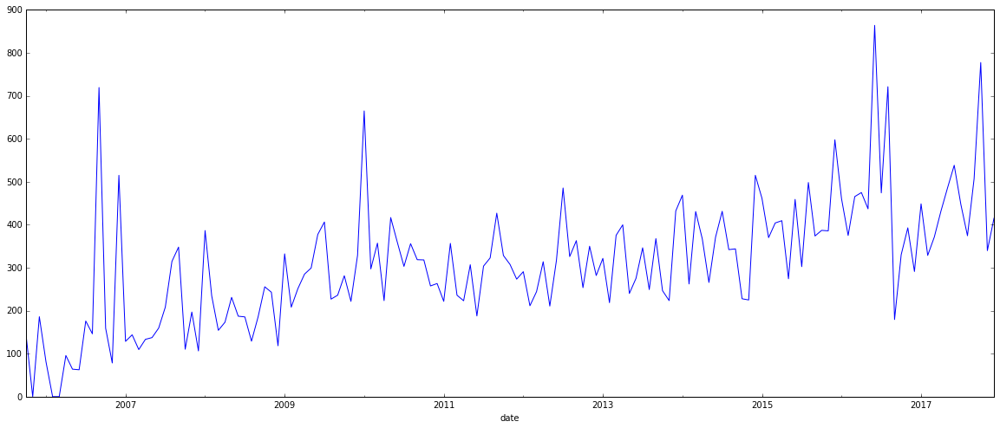

In [39]:
MAG_weekly.apply(rev_len).plot()

Average length of reviews monthly.

In [40]:
#MAG_weekly

We name the Series 'weekly' but they are indeed MONTHLY data.

In [41]:
MAG_weekly.apply(len).idxmax()

Timestamp('2011-06-30 00:00:00', offset='M')

In [42]:
MAG_weekly.apply(len).max()

298

Clearly June 2011 has most reviews (298).

In [43]:
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python

In [44]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)

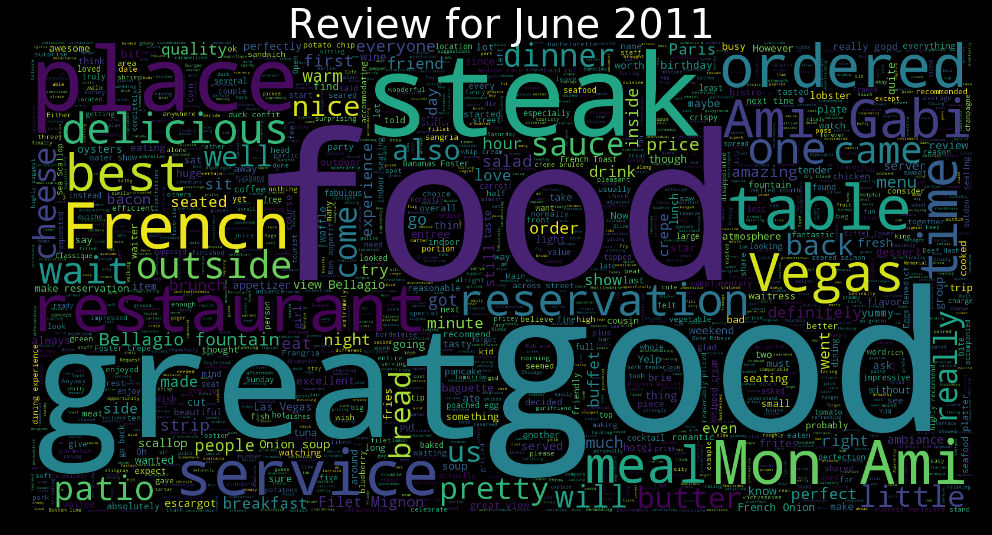

In [45]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(' '.join(MAG_weekly.ix['2011-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2011", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

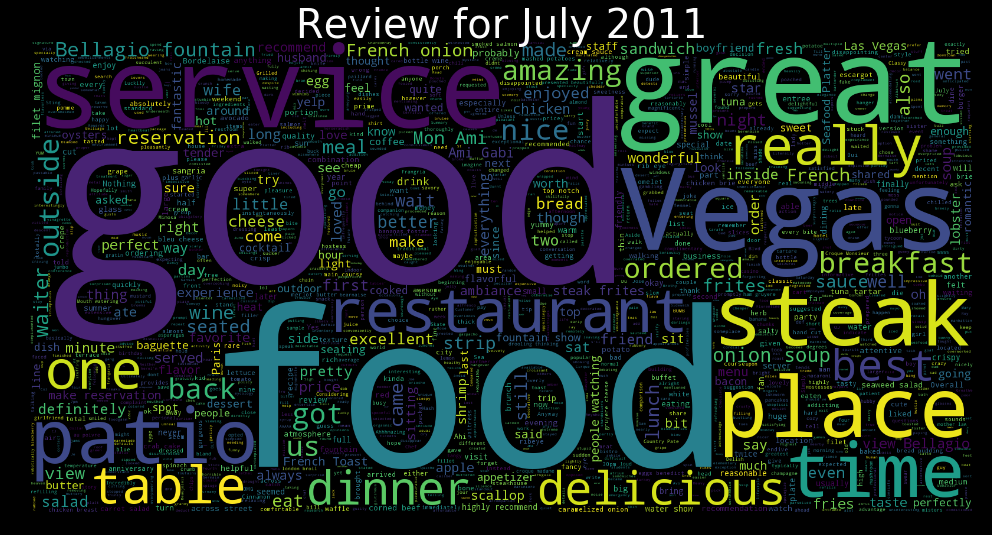

In [46]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc1 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc1.generate(' '.join(MAG_weekly.ix['2011-07-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for July 2011", fontsize=40,color='white')
plt.imshow(wc1, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

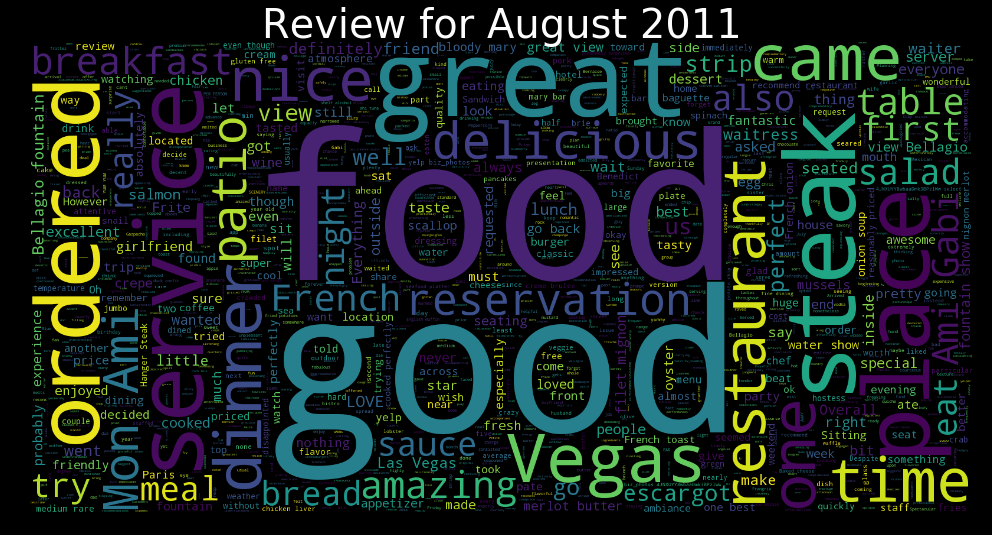

In [47]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc2 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc2.generate(' '.join(MAG_weekly.ix['2011-08-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for August 2011", fontsize=40,color='white')
plt.imshow(wc2, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

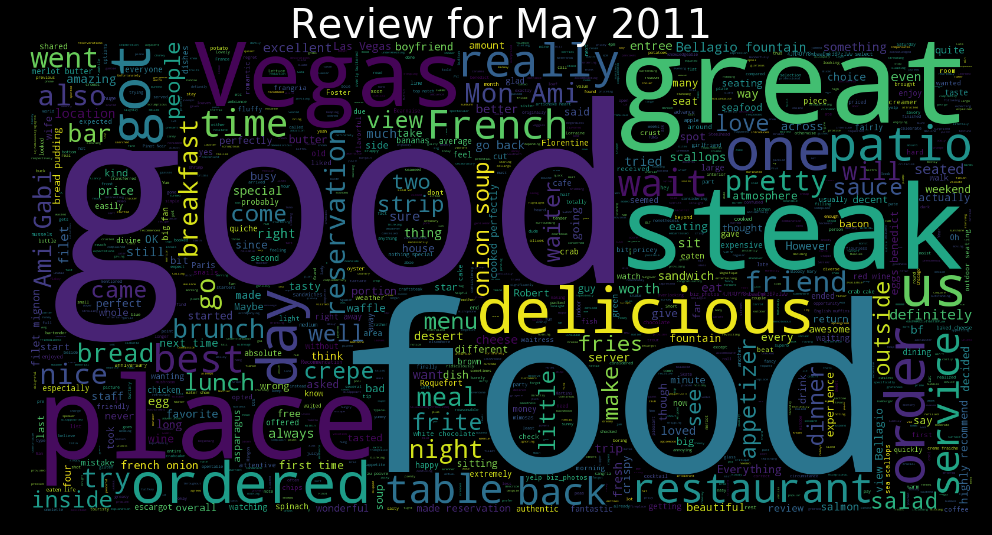

In [48]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc3 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc3.generate(' '.join(MAG_weekly.ix['2011-05-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for May 2011", fontsize=40,color='white')
plt.imshow(wc3, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

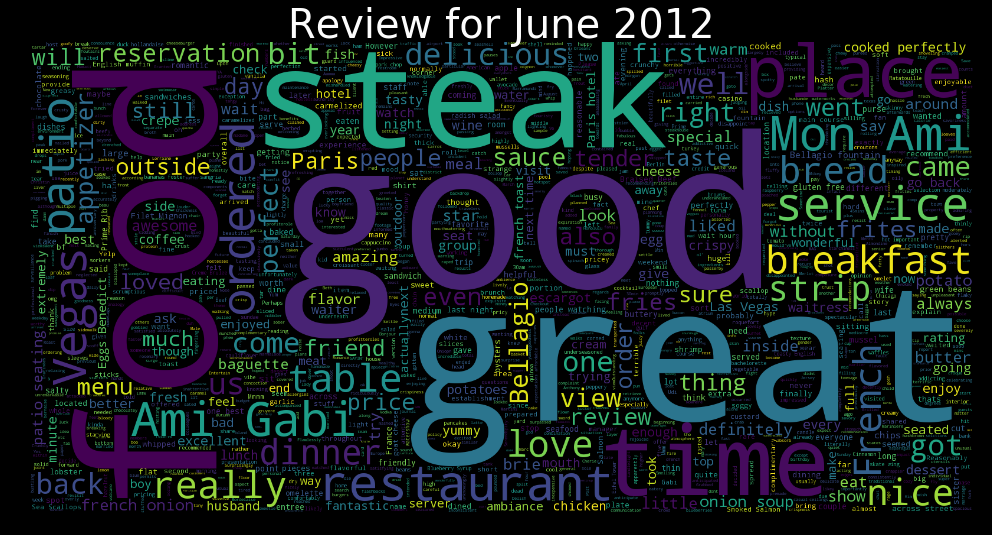

In [49]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2012-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2012", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

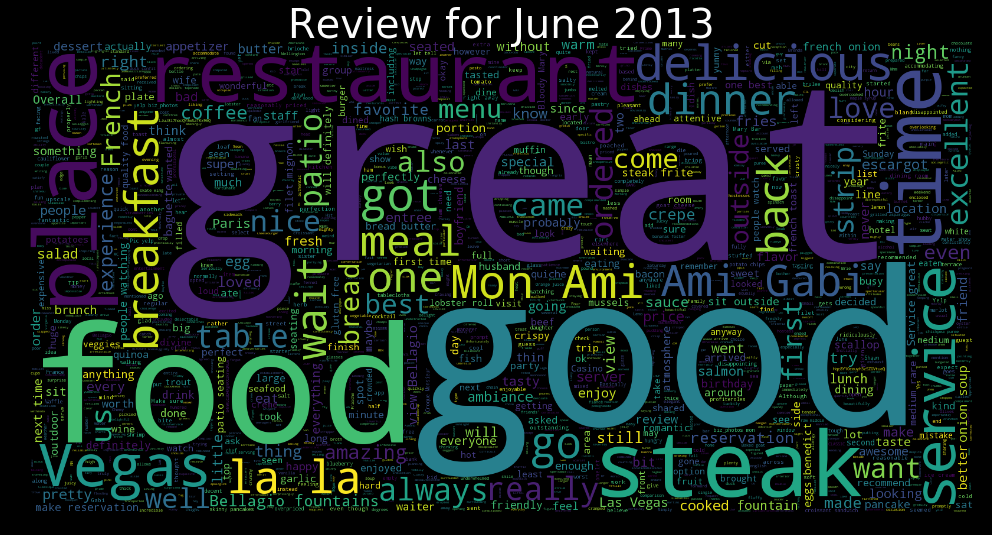

In [50]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2013-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2013", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

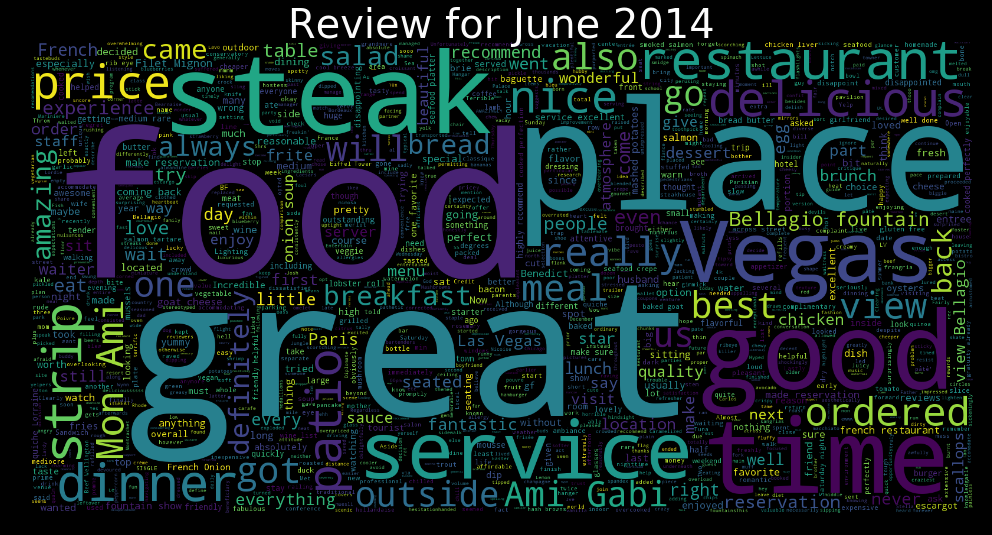

In [51]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2014-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2014", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

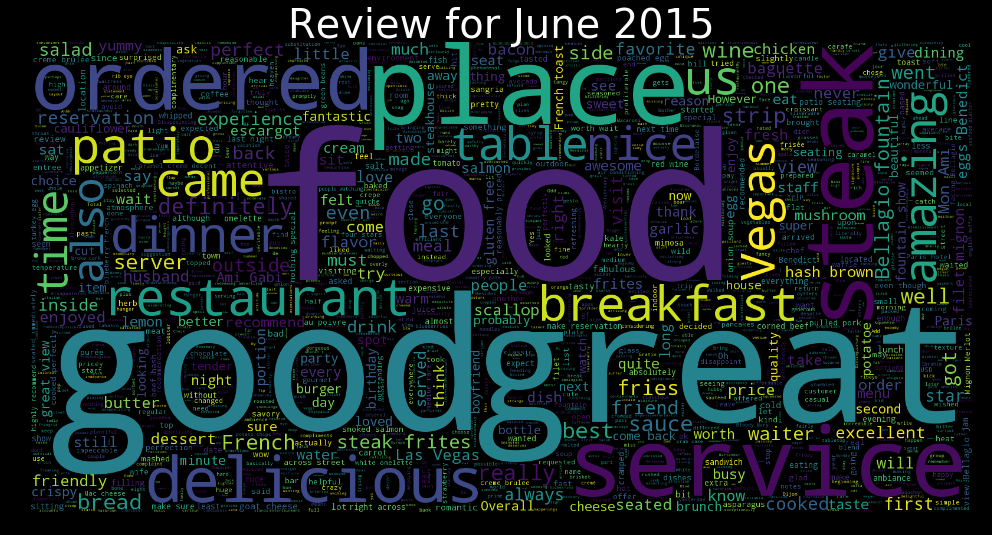

In [52]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2015-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2015", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

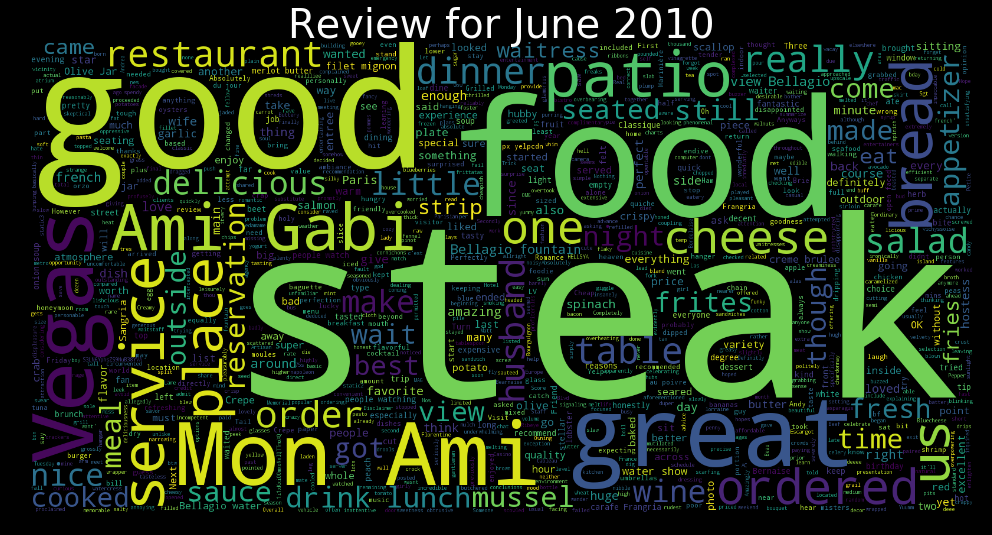

In [53]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2010-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2010", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

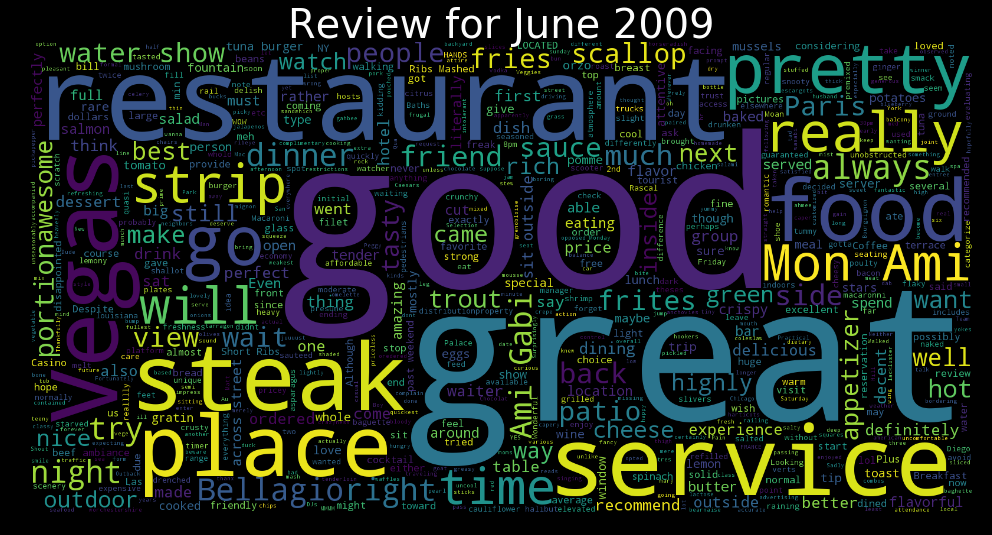

In [54]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2009-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2009", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

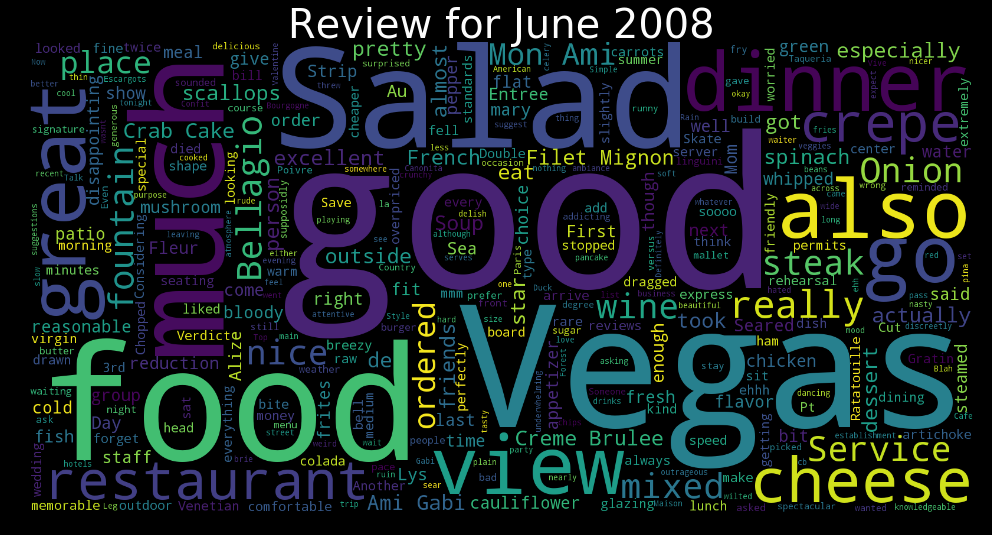

In [55]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2008-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2008", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

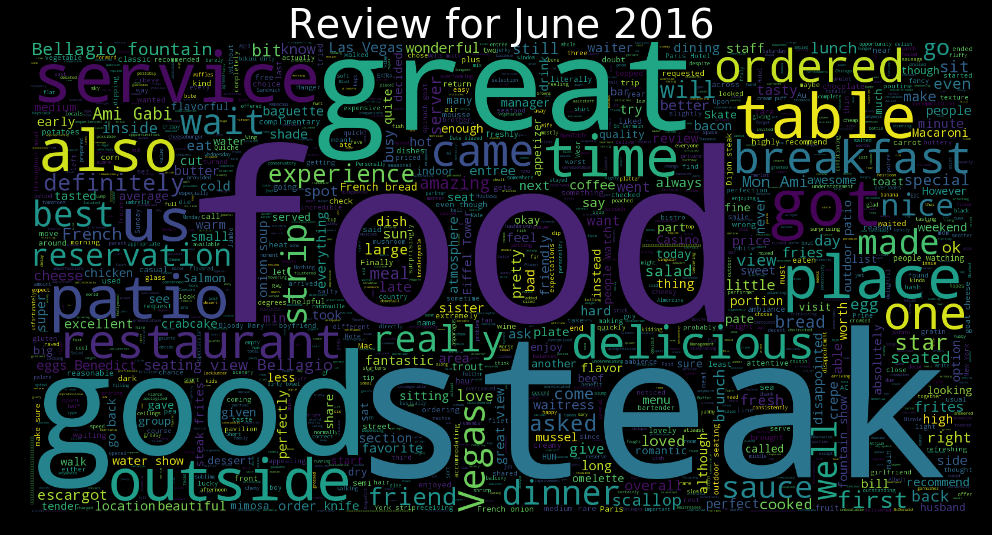

In [56]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2016-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2016", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

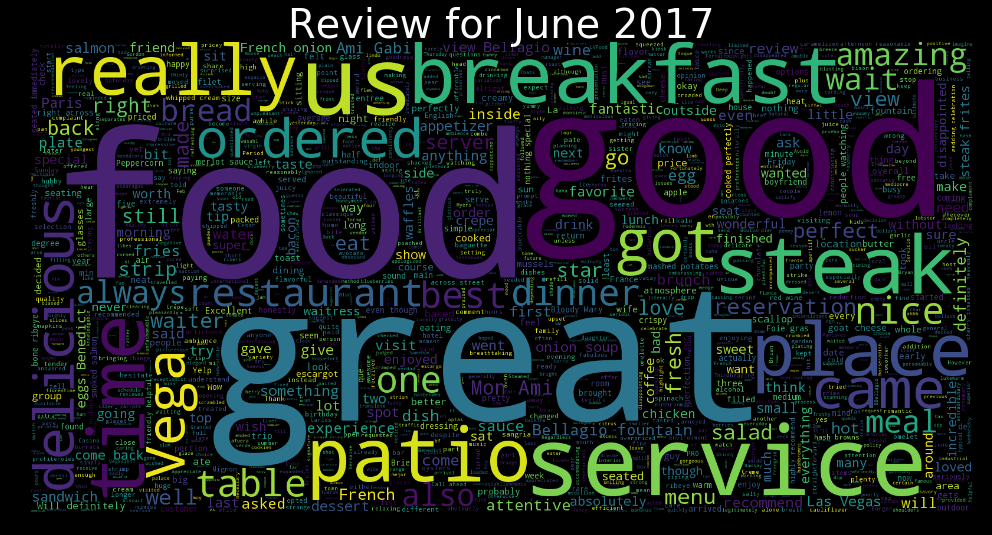

In [57]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(MAG_weekly.ix['2017-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2017", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

From above word cloud comparison you can see that most of the terms are similar, but their frequencies/occurrences (in sizes) are fairly different.

Now let us see if the LDA would some different results.

In [58]:
import re
from nltk import sent_tokenize, word_tokenize, pos_tag
from nltk import RegexpTokenizer #, PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords

In [59]:
stop = [x.strip().lower() for x in stopwords.words('english')]
stemmer = SnowballStemmer("english")
tokenizer = RegexpTokenizer(r'\w+')

In [60]:
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    #stop_free = [w.lower() for w in tokenizer.tokenize(doc) if w.lower() not in stop]
    punc_free = tokenizer.tokenize(stop_free)
    tags = pos_tag(punc_free)
    #filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "NNP", "NNPS", "VB", "VBD", "VBN", "VBP", "VBZ", "VBG"]]
    filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "VB", "VBD", "VBN", "VBP", "VBZ", "VBG"]]
    #filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "NNP", "NNPS"]]
    filtered_flat = [item for sublist in filtered for item in sublist]
    num_free = [x for x in filtered_flat if not (x.isdigit() or x[0] == '-' and x[1:].isdigit())]
    ##num_free = [x for x in stop_free if not (x.isdigit() or x[0] == '-' and x[1:].isdigit())]
    legit_words = [x for x in num_free if not len(x) <= 3]
    normalized = " ".join(stemmer.stem(word) for word in legit_words)
    
    return normalized

In [61]:
values_clean = [clean(s).split() for s in MAG_weekly.ix['2011-06-30']]

In [62]:
values_clean[0]

['star', 'place']

In [63]:
from gensim import corpora, models, similarities 
def lda(docs):
    #create a Gensim dictionary from the texts
    dictionary = corpora.Dictionary(docs)
    #remove extremes (similar to the min/max df step used when creating the tf-idf matrix)
    # a term has to appear in more than 10 docs, and the frequency cannot be over 50%
    #filtering boilerplate language
    dictionary.filter_extremes(no_below=10, no_above=0.5)
    #convert the dictionary to a bag of words corpus for reference
    corpus = [dictionary.doc2bow(text) for text in docs]
    lda_model = models.LdaModel(corpus, num_topics=15, id2word=dictionary, update_every=5, \
                            chunksize=2000, passes=50, alpha='auto', eta='auto', \
                           iterations = 100)
    #lda_model.show_topics(num_topics=10, num_words=5, log=True, formatted=True)
    return(lda_model)

In [64]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.221*"came" + 0.084*"star" + 0.082*"place" + 0.082*"dinner" + 0.076*"sauc" + 0.038*"time" + 0.035*"vega" + 0.033*"steak" + 0.027*"restaur" + 0.024*"gabi"'), (1, '0.106*"bellagio" + 0.105*"fountain" + 0.101*"didn" + 0.098*"view" + 0.076*"know" + 0.053*"show" + 0.030*"experi" + 0.030*"wait" + 0.027*"restaur" + 0.025*"meal"'), (2, '0.091*"recommend" + 0.077*"drink" + 0.062*"show" + 0.044*"servic" + 0.044*"patio" + 0.043*"filet" + 0.042*"scallop" + 0.041*"watch" + 0.036*"time" + 0.036*"place"'), (3, '0.425*"order" + 0.064*"steak" + 0.057*"sauc" + 0.041*"scallop" + 0.037*"food" + 0.037*"time" + 0.020*"place" + 0.020*"came" + 0.019*"strip" + 0.014*"restaur"'), (4, '0.074*"bread" + 0.066*"vega" + 0.058*"place" + 0.055*"steak" + 0.054*"gabi" + 0.052*"night" + 0.047*"food" + 0.042*"price" + 0.041*"order" + 0.038*"drink"'), (5, '0.127*"reserv" + 0.075*"dinner" + 0.062*"make" + 0.057*"made" + 0.049*"time" + 0.046*"onion" + 0.040*"place" + 0.030*"steak" + 0.029*"show" + 0.029*"sauc"'), (6, 

In [65]:
values_clean = [clean(s).split() for s in MAG_weekly.ix['2011-07-31']]

In [66]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.084*"food" + 0.078*"breakfast" + 0.078*"fountain" + 0.073*"view" + 0.058*"bellagio" + 0.057*"dinner" + 0.052*"servic" + 0.049*"came" + 0.040*"vega" + 0.035*"place"'), (1, '0.122*"wait" + 0.092*"food" + 0.075*"went" + 0.072*"tabl" + 0.060*"vega" + 0.047*"servic" + 0.045*"time" + 0.041*"lunch" + 0.038*"order" + 0.038*"place"'), (2, '0.148*"onion" + 0.104*"soup" + 0.059*"food" + 0.047*"order" + 0.046*"place" + 0.041*"patio" + 0.035*"vega" + 0.035*"servic" + 0.033*"bread" + 0.030*"salad"'), (3, '0.154*"wife" + 0.101*"night" + 0.081*"friend" + 0.052*"salad" + 0.048*"bread" + 0.043*"order" + 0.036*"waiter" + 0.027*"place" + 0.026*"vega" + 0.024*"food"'), (4, '0.112*"steak" + 0.107*"frite" + 0.082*"order" + 0.061*"sauc" + 0.035*"reserv" + 0.033*"vega" + 0.030*"price" + 0.027*"love" + 0.024*"salad" + 0.023*"made"'), (5, '0.102*"tast" + 0.062*"food" + 0.055*"order" + 0.054*"onion" + 0.047*"waiter" + 0.047*"sauc" + 0.047*"everyth" + 0.045*"place" + 0.039*"steak" + 0.038*"make"'), (6, '0.

In [67]:
values_clean = [clean(s).split() for s in MAG_weekly.ix['2011-08-31']]

In [68]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.160*"vega" + 0.101*"place" + 0.075*"dinner" + 0.063*"meal" + 0.061*"servic" + 0.055*"food" + 0.046*"breakfast" + 0.041*"seat" + 0.039*"gabi" + 0.037*"went"'), (1, '0.086*"steak" + 0.084*"food" + 0.072*"servic" + 0.068*"view" + 0.064*"seat" + 0.061*"order" + 0.059*"bellagio" + 0.059*"show" + 0.051*"time" + 0.044*"came"'), (2, '0.159*"fountain" + 0.137*"watch" + 0.134*"love" + 0.066*"show" + 0.061*"vega" + 0.047*"food" + 0.042*"gabi" + 0.035*"servic" + 0.026*"place" + 0.026*"view"'), (3, '0.168*"place" + 0.127*"vega" + 0.125*"food" + 0.125*"restaur" + 0.062*"gabi" + 0.060*"price" + 0.034*"servic" + 0.034*"reserv" + 0.027*"view" + 0.026*"came"'), (4, '0.152*"servic" + 0.121*"food" + 0.084*"view" + 0.076*"amaz" + 0.073*"strip" + 0.062*"came" + 0.060*"fountain" + 0.055*"cook" + 0.043*"vega" + 0.042*"place"'), (5, '0.107*"night" + 0.100*"reserv" + 0.082*"seat" + 0.081*"cook" + 0.069*"servic" + 0.063*"vega" + 0.058*"steak" + 0.055*"food" + 0.032*"view" + 0.031*"place"'), (6, '0.082*"f

In [71]:
values_clean = [clean(s).split() for s in MAG_weekly.ix['2011-09-30']]

In [70]:
lda_model1 = lda(values_clean)
topics1 = lda_model1.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics1)

[(0, '0.189*"made" + 0.166*"reserv" + 0.108*"food" + 0.062*"vega" + 0.036*"servic" + 0.034*"dinner" + 0.032*"order" + 0.032*"time" + 0.031*"place" + 0.028*"serv"'), (1, '0.106*"food" + 0.068*"reserv" + 0.057*"servic" + 0.054*"dinner" + 0.050*"time" + 0.049*"place" + 0.047*"made" + 0.044*"serv" + 0.043*"order" + 0.042*"steak"'), (2, '0.106*"food" + 0.068*"reserv" + 0.057*"servic" + 0.054*"dinner" + 0.050*"time" + 0.049*"place" + 0.047*"made" + 0.044*"serv" + 0.043*"order" + 0.042*"steak"'), (3, '0.194*"servic" + 0.147*"place" + 0.093*"star" + 0.067*"food" + 0.060*"thing" + 0.041*"reserv" + 0.032*"dinner" + 0.030*"time" + 0.028*"made" + 0.027*"serv"'), (4, '0.268*"steak" + 0.159*"dinner" + 0.150*"food" + 0.072*"friend" + 0.052*"servic" + 0.032*"bellagio" + 0.030*"amaz" + 0.030*"reserv" + 0.023*"time" + 0.020*"made"'), (5, '0.174*"sauc" + 0.105*"serv" + 0.100*"view" + 0.072*"dinner" + 0.064*"food" + 0.053*"patio" + 0.041*"reserv" + 0.034*"servic" + 0.031*"time" + 0.030*"place"'), (6, '0.1

In [72]:
values_clean = [clean(s).split() for s in MAG_weekly.ix['2012-06-30']]

In [73]:
lda_model2 = lda(values_clean)
topics2 = lda_model2.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics2)

[(0, '0.092*"food" + 0.092*"place" + 0.076*"gabi" + 0.060*"restaur" + 0.057*"time" + 0.055*"strip" + 0.054*"bellagio" + 0.052*"vega" + 0.049*"dinner" + 0.047*"watch"'), (1, '0.141*"place" + 0.101*"price" + 0.091*"servic" + 0.089*"strip" + 0.089*"food" + 0.066*"vega" + 0.064*"seat" + 0.062*"restaur" + 0.047*"love" + 0.044*"breakfast"'), (2, '0.100*"peopl" + 0.090*"watch" + 0.088*"gabi" + 0.084*"dinner" + 0.071*"place" + 0.063*"want" + 0.056*"time" + 0.052*"vega" + 0.047*"strip" + 0.042*"food"'), (3, '0.148*"love" + 0.141*"came" + 0.138*"potato" + 0.057*"price" + 0.050*"food" + 0.040*"time" + 0.031*"place" + 0.028*"gabi" + 0.027*"servic" + 0.026*"vega"'), (4, '0.098*"seat" + 0.097*"reserv" + 0.091*"patio" + 0.083*"time" + 0.073*"vega" + 0.067*"restaur" + 0.049*"come" + 0.048*"order" + 0.041*"love" + 0.037*"food"'), (5, '0.207*"bread" + 0.118*"tender" + 0.115*"steak" + 0.072*"come" + 0.064*"food" + 0.057*"seat" + 0.040*"place" + 0.035*"breakfast" + 0.033*"came" + 0.032*"dinner"'), (6, '0.

In [74]:
values_clean1 = [clean(s).split() for s in MAG_weekly.ix['2013-06-30']]

In [75]:
lda_model3 = lda(values_clean1)
topics3 = lda_model3.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics3)

[(0, '0.087*"thing" + 0.057*"place" + 0.051*"restaur" + 0.047*"breakfast" + 0.044*"vega" + 0.042*"time" + 0.036*"meal" + 0.036*"patio" + 0.034*"bellagio" + 0.033*"night"'), (1, '0.180*"love" + 0.092*"dine" + 0.086*"food" + 0.081*"time" + 0.057*"come" + 0.047*"know" + 0.038*"breakfast" + 0.027*"restaur" + 0.025*"view" + 0.022*"bellagio"'), (2, '0.137*"servic" + 0.092*"tast" + 0.082*"night" + 0.070*"tabl" + 0.048*"butter" + 0.043*"place" + 0.029*"came" + 0.029*"time" + 0.028*"made" + 0.027*"menu"'), (3, '0.109*"place" + 0.089*"everyth" + 0.077*"order" + 0.054*"came" + 0.054*"dinner" + 0.042*"servic" + 0.038*"fountain" + 0.036*"view" + 0.032*"bellagio" + 0.030*"time"'), (4, '0.106*"butter" + 0.091*"bread" + 0.076*"came" + 0.063*"fountain" + 0.061*"view" + 0.041*"peopl" + 0.039*"staff" + 0.034*"food" + 0.030*"love" + 0.028*"place"'), (5, '0.087*"wait" + 0.084*"seat" + 0.062*"place" + 0.052*"food" + 0.045*"fountain" + 0.044*"love" + 0.044*"bellagio" + 0.043*"meal" + 0.039*"time" + 0.038*"pe

In [76]:
def explore_topic(lda_model, topic_number, topn, output=True):
    """
    accept a ldamodel, atopic number and topn vocabs of interest
    prints a formatted list of the topn terms
    """
    terms = []
    for term, frequency in lda_model.show_topic(topic_number, topn=topn):
        terms += [term]
        if output:
            print(u'{:20} {:.3f}'.format(term, round(frequency, 3)))
    
    return terms

In [77]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

vega                 0.160
place                0.101
dinner               0.075
meal                 0.063
servic               0.061
food                 0.055
breakfast            0.046
seat                 0.041
gabi                 0.039
went                 0.037
Topic 1 |---------------------

steak                0.086
food                 0.084
servic               0.072
view                 0.068
seat                 0.064
order                0.061
bellagio             0.059
show                 0.059
time                 0.051
came                 0.044
Topic 2 |---------------------

fountain             0.159
watch                0.137
love                 0.134
show                 0.066
vega                 0.061
food                 0.047
gabi                 0.042
servic               0.035
place                0.026
view                 0.026
Topic 3 |---------------------

place                0.168
veg

In [78]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model1,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

made                 0.189
reserv               0.166
food                 0.108
vega                 0.062
servic               0.036
dinner               0.034
order                0.032
time                 0.032
place                0.031
serv                 0.028
Topic 1 |---------------------

food                 0.106
reserv               0.068
servic               0.057
dinner               0.054
time                 0.050
place                0.049
made                 0.047
serv                 0.044
order                0.043
steak                0.042
Topic 2 |---------------------

food                 0.106
reserv               0.068
servic               0.057
dinner               0.054
time                 0.050
place                0.049
made                 0.047
serv                 0.044
order                0.043
steak                0.042
Topic 3 |---------------------

servic               0.194
pla

In [79]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model2,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

food                 0.092
place                0.092
gabi                 0.076
restaur              0.060
time                 0.057
strip                0.055
bellagio             0.054
vega                 0.052
dinner               0.049
watch                0.047
Topic 1 |---------------------

place                0.141
price                0.101
servic               0.091
strip                0.089
food                 0.089
vega                 0.066
seat                 0.064
restaur              0.062
love                 0.047
breakfast            0.044
Topic 2 |---------------------

peopl                0.100
watch                0.090
gabi                 0.088
dinner               0.084
place                0.071
want                 0.063
time                 0.056
vega                 0.052
strip                0.047
food                 0.042
Topic 3 |---------------------

love                 0.148
cam

# Using LDA with Non-negative Matrix Factorization (NMF)

Since above LDA results are not very illustrative, we plan to compare the results from the original LDA and LDA + NMF. Gensim does not provide support for NMF - but Scikit-learn does.

In [80]:
MAG_weekly.head()

date
2005-10-31    [If you enjoy a little people watching with yo...
2005-11-30                                                   []
2005-12-31    [Though heartbroken and a bit aimless on my 22...
2006-01-31    [The food and wine was amazing, but the super ...
2006-02-28                                                   []
Freq: M, Name: text, dtype: object

In [81]:
indexes = list(MAG_weekly.index)
indexes

[Timestamp('2005-10-31 00:00:00', offset='M'),
 Timestamp('2005-11-30 00:00:00', offset='M'),
 Timestamp('2005-12-31 00:00:00', offset='M'),
 Timestamp('2006-01-31 00:00:00', offset='M'),
 Timestamp('2006-02-28 00:00:00', offset='M'),
 Timestamp('2006-03-31 00:00:00', offset='M'),
 Timestamp('2006-04-30 00:00:00', offset='M'),
 Timestamp('2006-05-31 00:00:00', offset='M'),
 Timestamp('2006-06-30 00:00:00', offset='M'),
 Timestamp('2006-07-31 00:00:00', offset='M'),
 Timestamp('2006-08-31 00:00:00', offset='M'),
 Timestamp('2006-09-30 00:00:00', offset='M'),
 Timestamp('2006-10-31 00:00:00', offset='M'),
 Timestamp('2006-11-30 00:00:00', offset='M'),
 Timestamp('2006-12-31 00:00:00', offset='M'),
 Timestamp('2007-01-31 00:00:00', offset='M'),
 Timestamp('2007-02-28 00:00:00', offset='M'),
 Timestamp('2007-03-31 00:00:00', offset='M'),
 Timestamp('2007-04-30 00:00:00', offset='M'),
 Timestamp('2007-05-31 00:00:00', offset='M'),
 Timestamp('2007-06-30 00:00:00', offset='M'),
 Timestamp('2

In [82]:
documents = MAG_weekly.ix['2012-06-30']

In [83]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

no_features = 1000

# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')

tfidf = tfidf_vectorizer.fit_transform(documents)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

In [84]:
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf = tf_vectorizer.fit_transform(documents)
tf_feature_names = tf_vectorizer.get_feature_names()

In [85]:
from sklearn.decomposition import NMF, LatentDirichletAllocation

no_topics = 20

# Run NMF
nmf_model = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)
nmf_W = nmf_model.transform(tfidf)
nmf_H = nmf_model.components_

# Run LDA
lda_model = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,
                                random_state=0).fit(tf)
lda_W = lda_model.transform(tf)
lda_H = lda_model.components_

In [86]:
def display_topics(H, W, feature_names, documents, no_top_words, no_top_documents):
    for topic_idx, topic in enumerate(H):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
        top_doc_indices = np.argsort( W[:,topic_idx] )[::-1][0:no_top_documents]
        for doc_index in top_doc_indices:
            print(documents[doc_index])

In [87]:
no_topics = 10
no_top_words = 10
no_top_documents = 2
display_topics(nmf_H, nmf_W, tfidf_feature_names, documents, no_top_words, no_top_documents)
display_topics(lda_H, lda_W, tf_feature_names, documents, no_top_words, no_top_documents)

Topic 0:
great service vegas food breakfast restaurant place time patio dinner
Is the service great or what?Bonjour! Love eating at this restaurant during breakfast time. ask for Patio seating not to hot not to cold during the autumn season. The thing i love most about this place is the awesome views of the strip and the Bellagio foutains. This restaurant is a great way to wake up to Las Vegas.. I normally have the waffles and coffee while i chat and enjoy the view. A Must do while you are in vegas. The only problem is not that much selctions on the menu. Prices are ok.I was really pleased with this restaurant. We went for breakfast, and we were admiring the dining rooms. Looks great for a romantic evening out!

For breakfast, we sat outside on the patio and it was great! The service was wonderful and food was really good! Prices for the food was decent and well worth the price. My sister had the eggs benedict which was really good and sauce was really light. I had an omelet with their

We observe that NMF provides topics that are easier to interpret that LDA.

So, we are going to use NMF as the modeling technique.

In [88]:
type(documents)

list

In [89]:
type(documents[0])

str

In [90]:
type(values_clean)

list

In [91]:
type(values_clean[0])

list

In [92]:
documents[0]

"Terrible service. The food (spinach and greens omelette) was greasy and salty. The only good thing about this place is the homemade English muffins.Great menu and kid friendly. Reasonably priced and a wonderful patio on the strip for people watching while you dine.They have gluten free french onion soup and it is delicious!\n\nThis restaurant does actually feel like a nice restaurant in Paris FR just less cramped and with more reasonable pricing. \n\nA warning on ordering gluten free- ask obsessively about every last item brought to you. This is a busy place and communication isn't as thorough as you may be used to so keep your guard up. \nLess importantly, when they say that you get gluten free bread it is infact just a couple of slices of toast. It's good for premade - Udi's quality if not Udi's itself, so enjoy.\n\nMy reason for giving 4 stars and not 5 is that the serving sizes are inconsistent. You'll have to look at other people's orders to see if the main course is enough or if

In [93]:
values_clean[0]

['servic',
 'food',
 'spinach',
 'salti',
 'thing',
 'place',
 'strip',
 'dine',
 'onion',
 'soup',
 'restaur',
 'restaur',
 'pari',
 'price',
 'item',
 'place',
 'communic',
 'thorough',
 'guard',
 'bread',
 'coupl',
 'premad',
 'qualiti',
 'reason',
 'inconsist',
 'cours',
 'need',
 'place',
 'everyon',
 'check',
 'gabi',
 'breakfast',
 'outdoor',
 'note',
 'wait',
 'server',
 'quich',
 'lorrain',
 'coffe',
 'coffe',
 'food',
 'breakfast',
 'wait',
 'patio',
 'chicken',
 'appl',
 'brie',
 'hotel',
 'vega',
 'time',
 'cinnamon',
 'skinni',
 'green',
 'muffin',
 'peopl',
 'slice',
 'star',
 'peopl',
 'order',
 'entre',
 'appet',
 'reserv',
 'hostess',
 'restaur',
 'crepe',
 'pancak',
 'keep',
 'take',
 'homemad',
 'cramp',
 'brought',
 'toast',
 'grab',
 'price',
 'use',
 'omelett',
 'gluten',
 'feel',
 'recal',
 'understand',
 'coffe',
 'expect',
 'crepe',
 'watch',
 'warn',
 'order',
 'give',
 'serv',
 'recommend',
 'sit',
 'relax']

Now we need to analyze the topic trends/distributions over time.

Two methods:
    1. Generate topics from all documents over time - then map these topics over documents along time;
    2. Methods suggested [here](http://jeriwieringa.com/2017/06/21/Calculating-and-Visualizing-Topic-Significance-over-Time-Part-1/).

## Generate a corpus of all review texts over time

We have all the review texts in MAG_weekly['text'], just retrieve all and combine.

In [94]:
MAG_weekly.head()

date
2005-10-31    [If you enjoy a little people watching with yo...
2005-11-30                                                   []
2005-12-31    [Though heartbroken and a bit aimless on my 22...
2006-01-31    [The food and wine was amazing, but the super ...
2006-02-28                                                   []
Freq: M, Name: text, dtype: object

In [95]:
type(MAG_weekly.ix['2005-10-31'])

list

In [96]:
type(MAG_weekly.ix['2005-10-31'][0])

str

In [97]:
MAG_weekly.ix['2005-10-31'][0]

'If you enjoy a little people watching with your dining, sit out on the outside terrace and watch Las Vegas tourist walk the strip as they celebrate their winnings or rave about the fabulous Bellagio fountains.'

In [98]:
MAG_weekly.ix['2005-10-31'][1]

'As the restaurant is directly across from the fountains, it is also a great place to dine while taking in the free show.'

In [99]:
MAG_weekly.ix['2005-10-31'][2]

' The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.'

In [100]:
list(MAG_weekly.values)[:5]

[['If you enjoy a little people watching with your dining, sit out on the outside terrace and watch Las Vegas tourist walk the strip as they celebrate their winnings or rave about the fabulous Bellagio fountains.',
  'As the restaurant is directly across from the fountains, it is also a great place to dine while taking in the free show.',
  ' The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.',
  ' We had excellent service..polite, prompt, helpful (great at helping us pick a great wine suited to our selections!) and personal.',
  ' And by the way,',
  " the wait staff aren't above snapping that great snapshot of you and your guest having a good time....it is great to be a tourist!affordable, fairly classic french food\n\nsit outside if you like to people watch\n\nor \n\nsee the bellagio fountain show\n\nvery reminiscent of paris\n(on steroids!)"],
 [],
 ["Though heartbroken and a bit aimless on my 22nd birthday, a meal at Mon Ami Gabi really 

In [101]:
doc_lst = [item for sublist in list(MAG_weekly.values) for item in sublist]
doc_lst[:5]

['If you enjoy a little people watching with your dining, sit out on the outside terrace and watch Las Vegas tourist walk the strip as they celebrate their winnings or rave about the fabulous Bellagio fountains.',
 'As the restaurant is directly across from the fountains, it is also a great place to dine while taking in the free show.',
 ' The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.',
 ' We had excellent service..polite, prompt, helpful (great at helping us pick a great wine suited to our selections!) and personal.',
 ' And by the way,']

In [102]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')

tfidf1 = tfidf_vectorizer.fit_transform(doc_lst)
tfidf_feature_names1 = tfidf_vectorizer.get_feature_names()

In [103]:
# Run NMF
no_topics = 15
nmf_model1 = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf1)
nmf_W = nmf_model1.transform(tfidf1)
nmf_H = nmf_model1.components_

In [104]:
#no_topics = 15
no_top_words = 15
no_top_documents = 0
display_topics(nmf_H, nmf_W, tfidf_feature_names1, doc_lst, no_top_words, no_top_documents)

Topic 0:
wait table patio outside seated reservations inside reservation seating minutes sit got make long worth
Topic 1:
food amazing quality price excellent stars prices location atmosphere ambiance reasonable wonderful awesome ok okay
Topic 2:
good pretty chicken coffee overall little quite sandwich brunch escargot actually fresh tasted choice meal
Topic 3:
steak frites fries cooked tender medium hanger sandwich rare poivre au classique perfectly order cut
Topic 4:
bellagio view fountains outside patio water fountain sit street watch strip people watching nice right
Topic 5:
french soup onion toast best fries bistro love cheese started restaurant like ve escargot salty
Topic 6:
mon ami gabi paris hotel strip recommend restaurants restaurant visit located did french dining favorite
Topic 7:
great location atmosphere view watching people meal service views wine experience spot prices selection strip
Topic 8:
service excellent friendly attentive waiter ambiance slow prompt wonderful no

Now we need to count the mentions of these topics on the documents.

In [105]:
topics = display_topics(nmf_H, nmf_W, tfidf_feature_names1, doc_lst, no_top_words, no_top_documents)
type(topics)

Topic 0:
wait table patio outside seated reservations inside reservation seating minutes sit got make long worth
Topic 1:
food amazing quality price excellent stars prices location atmosphere ambiance reasonable wonderful awesome ok okay
Topic 2:
good pretty chicken coffee overall little quite sandwich brunch escargot actually fresh tasted choice meal
Topic 3:
steak frites fries cooked tender medium hanger sandwich rare poivre au classique perfectly order cut
Topic 4:
bellagio view fountains outside patio water fountain sit street watch strip people watching nice right
Topic 5:
french soup onion toast best fries bistro love cheese started restaurant like ve escargot salty
Topic 6:
mon ami gabi paris hotel strip recommend restaurants restaurant visit located did french dining favorite
Topic 7:
great location atmosphere view watching people meal service views wine experience spot prices selection strip
Topic 8:
service excellent friendly attentive waiter ambiance slow prompt wonderful no

NoneType

In [120]:
topic_dict = dict()
for topic_idx, topic in enumerate(nmf_H):
    
    
    #print(topic_idx) # Topic ID
    
    k = topic_idx
    v = []
    for i in topic.argsort()[:-no_top_words - 1:-1]:
        
        #print(tfidf_feature_names1[i])
        v.append(tfidf_feature_names1[i])
        topic_dict[k] = v
print(topic_dict)

{0: ['wait', 'table', 'patio', 'outside', 'seated', 'reservations', 'inside', 'reservation', 'seating', 'minutes', 'sit', 'got', 'make', 'long', 'worth'], 1: ['food', 'amazing', 'quality', 'price', 'excellent', 'stars', 'prices', 'location', 'atmosphere', 'ambiance', 'reasonable', 'wonderful', 'awesome', 'ok', 'okay'], 2: ['good', 'pretty', 'chicken', 'coffee', 'overall', 'little', 'quite', 'sandwich', 'brunch', 'escargot', 'actually', 'fresh', 'tasted', 'choice', 'meal'], 3: ['steak', 'frites', 'fries', 'cooked', 'tender', 'medium', 'hanger', 'sandwich', 'rare', 'poivre', 'au', 'classique', 'perfectly', 'order', 'cut'], 4: ['bellagio', 'view', 'fountains', 'outside', 'patio', 'water', 'fountain', 'sit', 'street', 'watch', 'strip', 'people', 'watching', 'nice', 'right'], 5: ['french', 'soup', 'onion', 'toast', 'best', 'fries', 'bistro', 'love', 'cheese', 'started', 'restaurant', 'like', 've', 'escargot', 'salty'], 6: ['mon', 'ami', 'gabi', 'paris', 'hotel', 'strip', 'recommend', 'resta

In [124]:
def get_topics(H, W, feature_names, no_top_words):
    topic_dict = dict()
    for topic_idx, topic in enumerate(H):
        #print("Topic %d:" % (topic_idx))
        k = 'Topic' + str(topic_idx)
        v = []
        for i in topic.argsort()[:-no_top_words - 1:-1]:
            v.append(tfidf_feature_names1[i])
            topic_dict[k] = v
    return(topic_dict)
        #top_doc_indices = np.argsort( W[:,topic_idx] )[::-1][0:no_top_documents]
        #for doc_index in top_doc_indices:
            #print(documents[doc_index])

In [125]:
topics = get_topics(nmf_H, nmf_W, tfidf_feature_names1, no_top_words)
type(topics)

dict

In [126]:
topics

{'Topic0': ['wait',
  'table',
  'patio',
  'outside',
  'seated',
  'reservations',
  'inside',
  'reservation',
  'seating',
  'minutes',
  'sit',
  'got',
  'make',
  'long',
  'worth'],
 'Topic1': ['food',
  'amazing',
  'quality',
  'price',
  'excellent',
  'stars',
  'prices',
  'location',
  'atmosphere',
  'ambiance',
  'reasonable',
  'wonderful',
  'awesome',
  'ok',
  'okay'],
 'Topic10': ['ordered',
  'sauce',
  'cheese',
  'came',
  'filet',
  'eggs',
  'salad',
  'salmon',
  'mignon',
  'cooked',
  'got',
  'benedict',
  'medium',
  'wine',
  'chicken'],
 'Topic11': ['just',
  'like',
  'don',
  'ok',
  'right',
  'fries',
  'feel',
  'mouth',
  'didn',
  'tasted',
  'say',
  'think',
  'felt',
  'maybe',
  'know'],
 'Topic12': ['bread',
  'butter',
  'fresh',
  'warm',
  'amazing',
  'free',
  'pudding',
  'baguette',
  'gluten',
  'meal',
  'served',
  'french',
  'carrot',
  'brought',
  'garlic'],
 'Topic13': ['really',
  'enjoyed',
  'nice',
  'like',
  'didn',
  'l

In [127]:
for k,v in topic_dict.items():
    for w in v:
        print(w)
        break

wait
food
good
steak
bellagio
french
mon
great
service
vegas
ordered
just
bread
really
delicious


In [130]:
my_doc = MAG_weekly.ix['2011-05-31']
my_doc

['The location takes the cake for this Lettuce Entertain You restaurant on the strip.',
 "I would highly recommend a reservation; the downside is you can't get a reservation for the patio - the best patio on the Strip - so that's a long wait if you're wanting to do that.\n\n$260 got the four of us two mid-range bottles of red wine, one salad, four entrees, and one dessert.",
 "I didn't think it was ridiculously overpriced, it's just I would rather eat someplace else.\n\nThe atmosphere was kind of cheesey & touristy, and it was extremely dark in there.",
 "Maybe I'm just getting old, but I could barely read the menu.",
 'The first bottle of wine we got was just straight up rancid; once we asked about it, they were quick to replace it.',
 'The French bread and garlic butter was really good to start out with.\n\nI had sea bass, it was just OK.',
 'I think the concensus from the table was everything was just OK.',
 'Maybe I expected more?\n\nOh, except the bread pudding.',
 'The white choc

In [135]:
for s in my_doc:
    for w in s.split():
        print(w.lower())

the
location
takes
the
cake
for
this
lettuce
entertain
you
restaurant
on
the
strip.
i
would
highly
recommend
a
reservation;
the
downside
is
you
can't
get
a
reservation
for
the
patio
-
the
best
patio
on
the
strip
-
so
that's
a
long
wait
if
you're
wanting
to
do
that.
$260
got
the
four
of
us
two
mid-range
bottles
of
red
wine,
one
salad,
four
entrees,
and
one
dessert.
i
didn't
think
it
was
ridiculously
overpriced,
it's
just
i
would
rather
eat
someplace
else.
the
atmosphere
was
kind
of
cheesey
&
touristy,
and
it
was
extremely
dark
in
there.
maybe
i'm
just
getting
old,
but
i
could
barely
read
the
menu.
the
first
bottle
of
wine
we
got
was
just
straight
up
rancid;
once
we
asked
about
it,
they
were
quick
to
replace
it.
the
french
bread
and
garlic
butter
was
really
good
to
start
out
with.
i
had
sea
bass,
it
was
just
ok.
i
think
the
concensus
from
the
table
was
everything
was
just
ok.
maybe
i
expected
more?
oh,
except
the
bread
pudding.
the
white
chocolate
bread
pudding
was
amazing.had
lunch
here

In [136]:
import spacy

In [158]:
nlp = spacy.load('en_core_web_sm')

In [156]:
d1 = nlp('We finished up around 12 noon and there was a long line on our way out.')
for tok in d1:
    if (tok.is_stop == False) and (tok.is_alpha == True):
        print(tok.lemma_)

-PRON-
finish
noon
long
line
way


In [159]:
tok_lst  = []
for d in my_doc:
    doc = nlp(d)
    for token in doc:
        if token.is_stop == False and token.is_alpha == True:
            tok_lst.append(token.lemma_)
            #break

In [160]:
tok_lst[0:50]

['the',
 'location',
 'take',
 'cake',
 'lettuce',
 'entertain',
 '-PRON-',
 'restaurant',
 'strip',
 '-PRON-',
 'highly',
 'recommend',
 'reservation',
 'downside',
 'reservation',
 'patio',
 'good',
 'patio',
 'strip',
 'long',
 'wait',
 'want',
 'get',
 'mid',
 'range',
 'bottle',
 'red',
 'wine',
 'salad',
 'entree',
 'dessert',
 '-PRON-',
 'think',
 'ridiculously',
 'overprice',
 '-PRON-',
 'eat',
 'someplace',
 'the',
 'atmosphere',
 'kind',
 'cheesey',
 'touristy',
 'extremely',
 'dark',
 'maybe',
 '-PRON-',
 'get',
 'old',
 '-PRON-']

In [161]:
from collections import Counter
counter_dict = dict(Counter(tok_lst))
counter_dict

{'weekend': 6,
 'hah': 1,
 'bill': 1,
 'head': 1,
 'awhile': 2,
 'pea': 2,
 'seating': 8,
 'south': 1,
 'ham': 1,
 'baguette': 1,
 'touristy': 2,
 'people': 10,
 'coffee': 3,
 'sunny': 2,
 'this': 7,
 'lettuce': 2,
 'ami': 15,
 'take': 8,
 'outdoor': 4,
 'impressed': 1,
 'taste': 9,
 'out': 1,
 'madame': 1,
 'highly': 6,
 'naturally': 1,
 'bleu': 1,
 'quality': 1,
 'sized': 1,
 'friendly': 3,
 'eaten': 1,
 'ciabatta': 1,
 'previous': 2,
 'anymore': 1,
 'provide': 3,
 'to': 2,
 'pricey': 4,
 'sandwich': 11,
 'gratinee': 1,
 'nail': 1,
 'benedict': 8,
 'regardless': 1,
 'puree': 1,
 'frites': 1,
 'quick': 1,
 'touch': 1,
 'make': 5,
 'probably': 4,
 'summer': 1,
 'end': 7,
 'side': 2,
 'today': 1,
 'sell': 1,
 'steakhouse': 1,
 'goodness': 1,
 'croque': 1,
 'hungover': 1,
 'beat': 3,
 'vibrant': 1,
 'possible': 1,
 'strip': 11,
 'fish': 3,
 'gruyere': 1,
 'gorgeous': 1,
 'next': 2,
 'significantly': 1,
 'leave': 3,
 'lift': 1,
 'yeah': 1,
 'caesar': 1,
 'n': 1,
 'bus': 1,
 'barely': 2,
 

In [165]:

topics.keys()

dict_keys(['Topic1', 'Topic13', 'Topic3', 'Topic0', 'Topic8', 'Topic2', 'Topic11', 'Topic6', 'Topic10', 'Topic5', 'Topic14', 'Topic4', 'Topic9', 'Topic7', 'Topic12'])

In [169]:
'wait' in topics['Topic0']

True

In [172]:
topic_count_dict = {}
v1 = 0
for k,v in counter_dict.items():
    for k1 in topics.keys():
        if k in topics[k1]:
            v1 += v
            topic_count_dict[k1] = v1

In [173]:
topic_count_dict

{'Topic0': 1882,
 'Topic1': 1837,
 'Topic10': 1357,
 'Topic11': 1398,
 'Topic12': 1792,
 'Topic13': 1086,
 'Topic14': 1784,
 'Topic2': 1776,
 'Topic3': 1913,
 'Topic4': 1678,
 'Topic5': 1645,
 'Topic6': 1573,
 'Topic7': 1768,
 'Topic8': 1608,
 'Topic9': 1799}

In [194]:
def my_topic_count(text):
    topic_count_dict = dict()
    counter_dict = dict()
    v1 = 0
    tok_lst = []
    for s in text:
        
        d = nlp(s)
        for tok in d:
            if tok.is_stop == False and tok.is_alpha == True:
                tok_lst.append(tok.lemma_)
    counter_dict = dict(Counter(tok_lst))
    #topic_count_dict = {}
    
    for k,v in counter_dict.items():
        for k1 in topics.keys():
            if k in topics[k1]:
                v1 += v
                topic_count_dict[k1] = v1
    return(pd.Series(topic_count_dict))

In [195]:
print(my_topic_count(MAG_weekly.ix['2011-05-31']))

Topic0     1882
Topic1     1837
Topic10    1357
Topic11    1398
Topic12    1792
Topic13    1086
Topic14    1784
Topic2     1776
Topic3     1913
Topic4     1678
Topic5     1645
Topic6     1573
Topic7     1768
Topic8     1608
Topic9     1799
dtype: int64


In [196]:
topic_count_df = MAG_weekly.apply(my_topic_count)
topic_count_df.head()

,Topic0,Topic1,Topic10,Topic11,Topic12,Topic13,Topic14,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9
date,,,,,,,,,,,,,,,
2005-10-31,62.0,59.0,19.0,27.0,8.0,26.0,NaN,56.0,NaN,53.0,28.0,52.0,55.0,40.0,61.0
2005-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-31,NaN,NaN,NaN,NaN,7.0,NaN,4.0,3.0,NaN,NaN,NaN,8.0,6.0,NaN,5.0
2006-01-31,29.0,49.0,27.0,19.0,35.0,48.0,32.0,46.0,24.0,43.0,22.0,42.0,45.0,20.0,51.0
2006-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


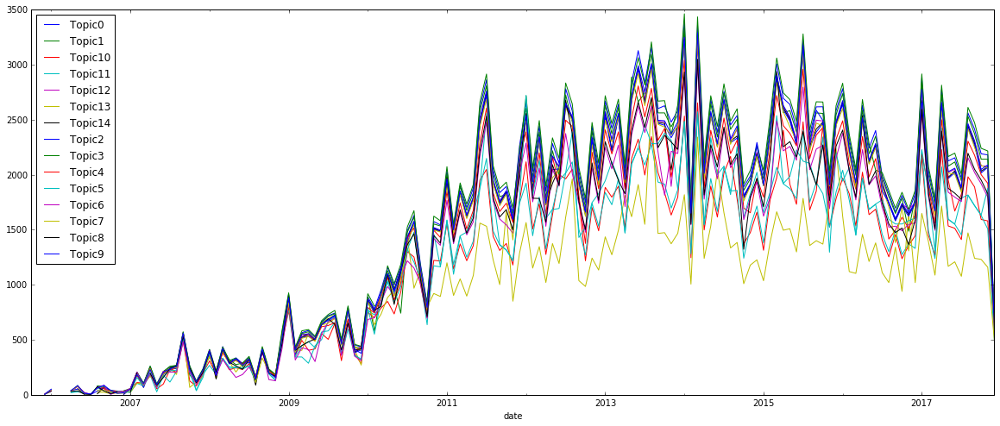

In [197]:
topic_count_df.plot()

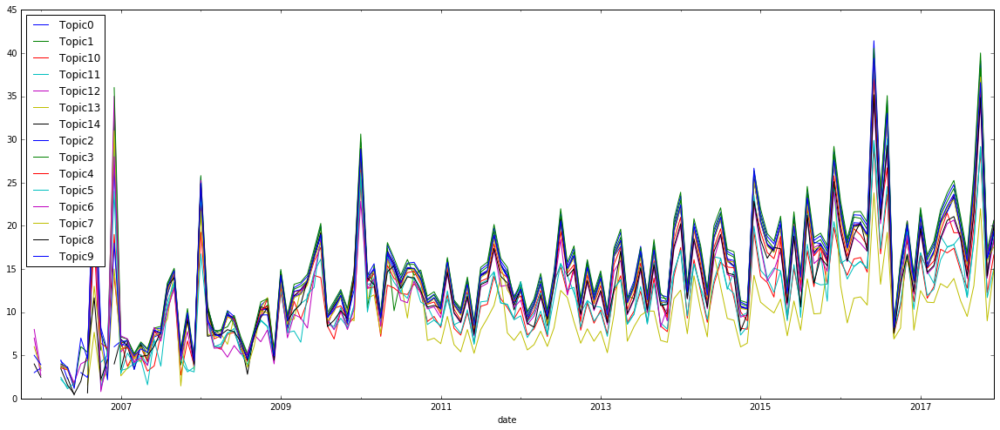

In [204]:
#Standardize over number of reviews
#topic_count_no_reviews = 
MAG_count = MAG_weekly.apply(len)
#type(MAG_count)
topic_count_df.divide(MAG_count, axis='index').plot()

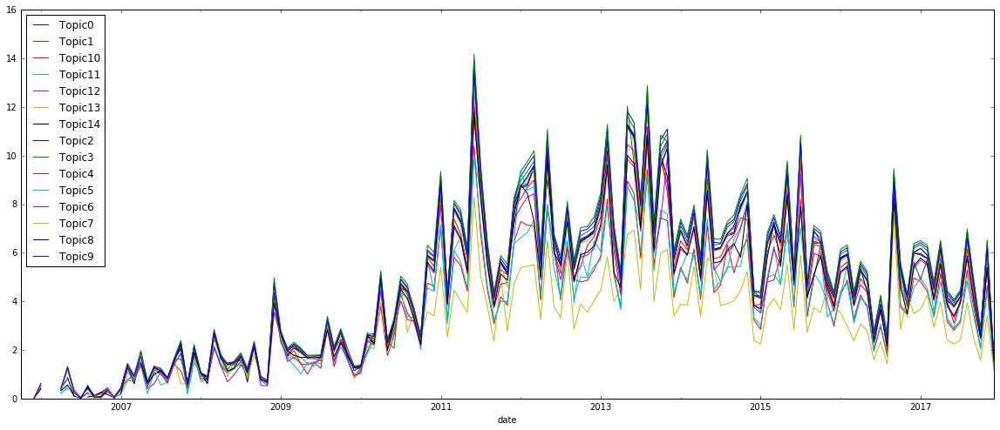

In [203]:
#Standardize over average length of reviews
#topic_count_no_reviews = 
MAG_average = MAG_weekly.apply(rev_len)
#type(MAG_count)
topic_count_df.divide(MAG_average, axis='index').plot()

In [207]:
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer1 = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf1 = tf_vectorizer1.fit_transform(doc_lst)
tf_feature_names2 = tf_vectorizer1.get_feature_names()
lda_model = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,
                                random_state=0).fit(tf1)
lda_W = lda_model.transform(tf1)
lda_H = lda_model.components_

In [209]:
topics_lda = get_topics(lda_H, lda_W, tf_feature_names2, no_top_words)

In [210]:
topics_lda

{'Topic0': ['breakfast',
  'did',
  'enjoyed',
  'love',
  'waiter',
  'party',
  'times',
  'group',
  'favorite',
  'wish',
  'morning',
  'restaurants',
  'impressed',
  'half',
  'fruit'],
 'Topic1': ['table',
  'seated',
  'inside',
  'wait',
  'minutes',
  'soup',
  'reservation',
  'time',
  'restaurant',
  'reservations',
  'onion',
  'outside',
  'french',
  'right',
  'sat'],
 'Topic10': ['sauce',
  'scallops',
  'ordered',
  'dish',
  'good',
  'mussels',
  'wine',
  'escargot',
  'pate',
  'tasty',
  'seafood',
  'served',
  'garlic',
  'steak',
  'fish'],
 'Topic11': ['cooked',
  'ordered',
  'medium',
  'perfectly',
  'rare',
  'got',
  'large',
  'like',
  'good',
  'toast',
  'perfect',
  'flavor',
  'delicious',
  'steak',
  'salad'],
 'Topic12': ['patio',
  'outside',
  'people',
  'sit',
  'place',
  'wait',
  'strip',
  'great',
  'watching',
  'night',
  'fountain',
  'watch',
  'bellagio',
  'eat',
  'seating'],
 'Topic13': ['steak',
  'frites',
  'came',
  'beef'

In [212]:
def my_lda_count(text):
    topic_count_dict = dict()
    counter_dict = dict()
    v1 = 0
    tok_lst = []
    for s in text:
        
        d = nlp(s)
        for tok in d:
            if tok.is_stop == False and tok.is_alpha == True:
                tok_lst.append(tok.lemma_)
    counter_dict = dict(Counter(tok_lst))
    #topic_count_dict = {}
    
    for k,v in counter_dict.items():
        for k1 in topics.keys():
            if k in topics_lda[k1]:
                v1 += v
                topic_count_dict[k1] = v1
    return(pd.Series(topic_count_dict))

In [213]:
lda_count_df = MAG_weekly.apply(my_lda_count)
lda_count_df.head()

,Topic0,Topic1,Topic10,Topic11,Topic12,Topic13,Topic14,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9
date,,,,,,,,,,,,,,,
2005-10-31,NaN,88.0,78.0,76.0,89.0,NaN,71.0,81.0,47.0,NaN,69.0,83.0,90.0,75.0,NaN
2005-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,4.0,NaN,NaN,NaN,5.0,NaN,NaN
2006-01-31,26.0,29.0,44.0,42.0,40.0,38.0,20.0,48.0,32.0,27.0,24.0,49.0,52.0,53.0,46.0
2006-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


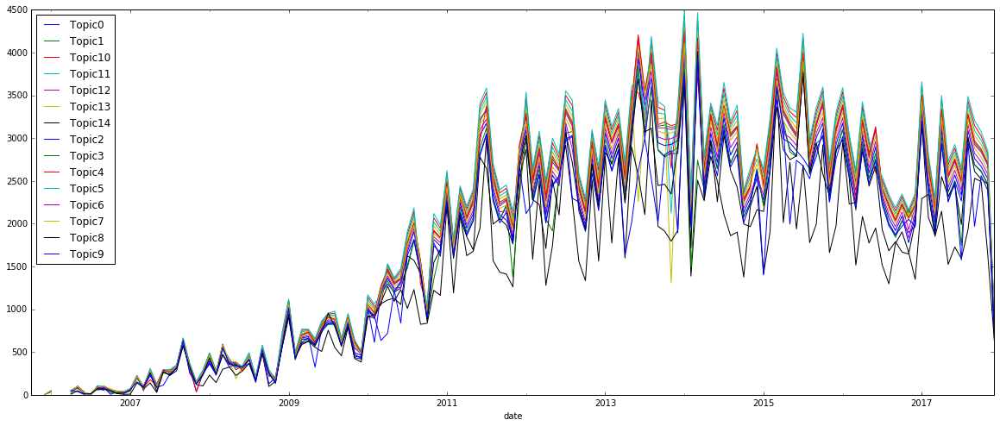

In [214]:
lda_count_df.plot()

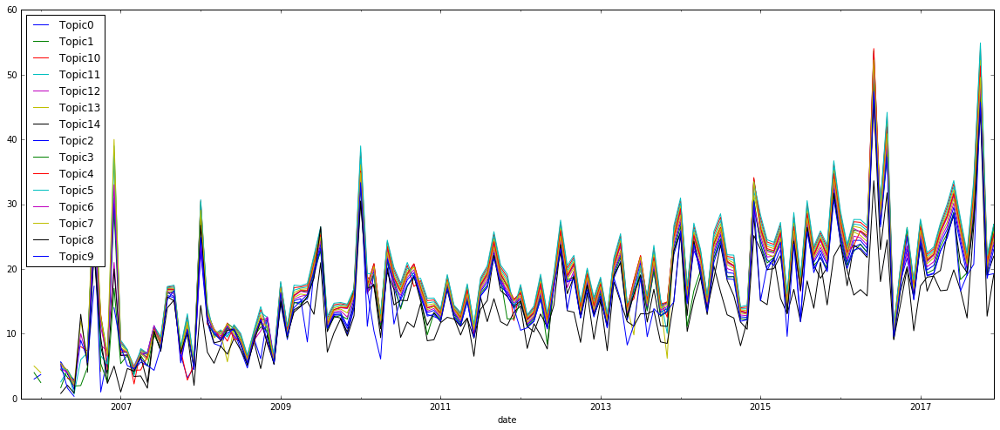

In [215]:
lda_count_df.divide(MAG_count, axis='index').plot()

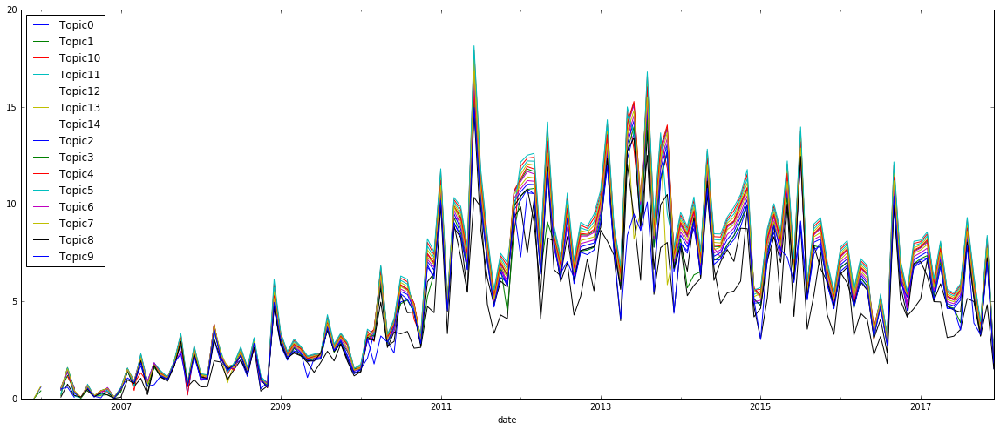

In [216]:
lda_count_df.divide(MAG_average, axis='index').plot()

Similar pattern is shown here (LDA vs. NMF). Now let us look at the average star levels across time.

# Stars

In [219]:
MAG_star = MAG_df['stars']
MAG_star.head()

date
2005-10-10    5
2005-10-15    5
2005-12-02    4
2006-01-07    4
2006-01-31    5
Name: stars, dtype: int64

In [221]:
MAG_stars_monthly = MAG_star.resample('M').mean()
MAG_stars_monthly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
MAG_stars_monthly.head()

date
2005-10-31    5.000000
2005-12-31    4.000000
2006-01-31    4.500000
2006-04-30    4.000000
2006-05-31    4.333333
Name: stars, dtype: float64

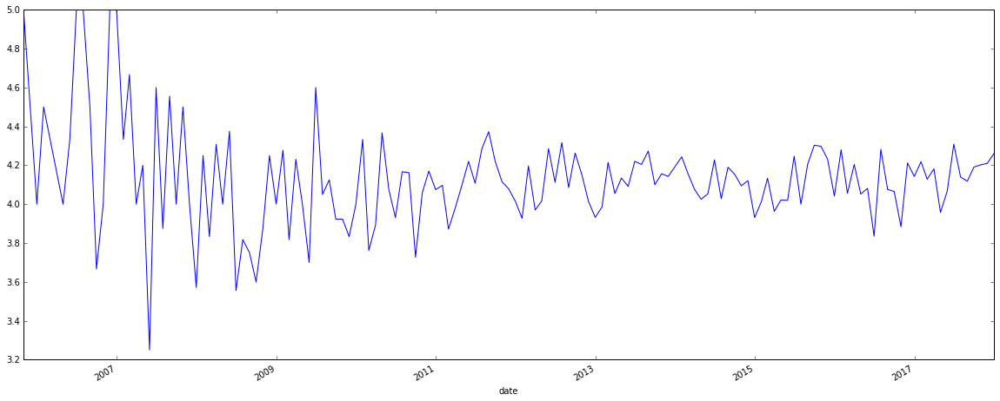

In [222]:
MAG_stars_monthly.plot()


# Useful, Funny, Cool

In [224]:
MAG_metrics = MAG_df[['useful', 'funny', 'cool']]
MAG_metrics.head()

,useful,funny,cool
date,,,
2005-10-10,0,0,0
2005-10-15,2,2,2
2005-12-02,3,2,3
2006-01-07,1,0,0
2006-01-31,0,1,0


In [225]:
MAG_metrics_monthly = MAG_metrics.resample('M').mean()
MAG_metrics_monthly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
MAG_metrics_monthly.head()

,useful,funny,cool
date,,,
2005-10-31,1.0,1.0,1.0
2005-12-31,3.0,2.0,3.0
2006-01-31,0.5,0.5,0.0
2006-04-30,2.0,0.0,1.0
2006-05-31,0.0,0.0,0.0


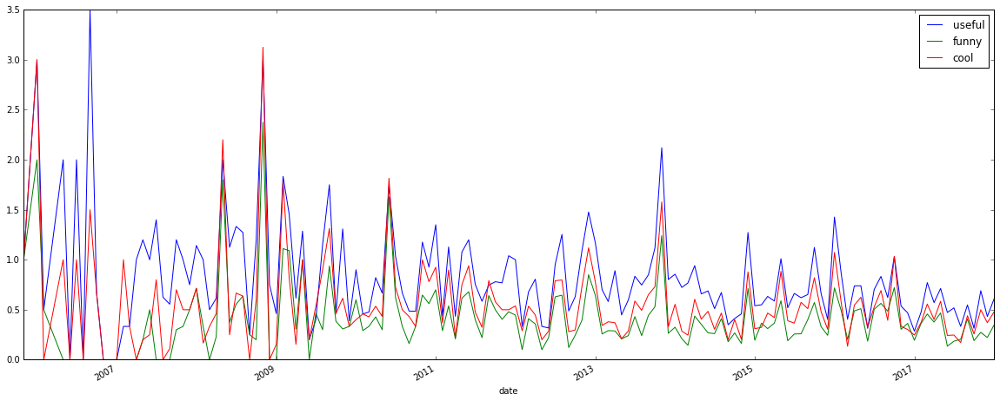

In [226]:
MAG_metrics_monthly.plot()

So much for topic analysis, now we move on to sentiment analysis.

Firstly, we are going to use Textblob.

In [227]:
MAG_weekly.ix['2011-05-31']

['The location takes the cake for this Lettuce Entertain You restaurant on the strip.',
 "I would highly recommend a reservation; the downside is you can't get a reservation for the patio - the best patio on the Strip - so that's a long wait if you're wanting to do that.\n\n$260 got the four of us two mid-range bottles of red wine, one salad, four entrees, and one dessert.",
 "I didn't think it was ridiculously overpriced, it's just I would rather eat someplace else.\n\nThe atmosphere was kind of cheesey & touristy, and it was extremely dark in there.",
 "Maybe I'm just getting old, but I could barely read the menu.",
 'The first bottle of wine we got was just straight up rancid; once we asked about it, they were quick to replace it.',
 'The French bread and garlic butter was really good to start out with.\n\nI had sea bass, it was just OK.',
 'I think the concensus from the table was everything was just OK.',
 'Maybe I expected more?\n\nOh, except the bread pudding.',
 'The white choc

In [236]:
polarity_scores = []
for s in MAG_weekly.ix['2011-05-31']:
    testmonial = tb.TextBlob(s)
    #print(type(testmonial.sentiment.polarity))
    polarity_scores.append(testmonial.sentiment.polarity)
print(sum(polarity_scores)/len(polarity_scores))

0.25752331164176817


In [239]:
def blob_senti(text):
    pol_scores = []
    mean_score = 0
    for s in text:
        tm = tb.TextBlob(s)
        pol_scores.append(tm.sentiment.polarity)
    if(len(pol_scores)>0):
        mean_score = sum(pol_scores)/len(pol_scores)
    else:
        mean_score = np.nan
    return(mean_score)

In [240]:
MAG_senti_blob = MAG_weekly.apply(blob_senti)

In [241]:
MAG_senti_blob.head()

date
2005-10-31    0.265799
2005-11-30         NaN
2005-12-31    0.500000
2006-01-31    0.013921
2006-02-28         NaN
Freq: M, Name: text, dtype: float64

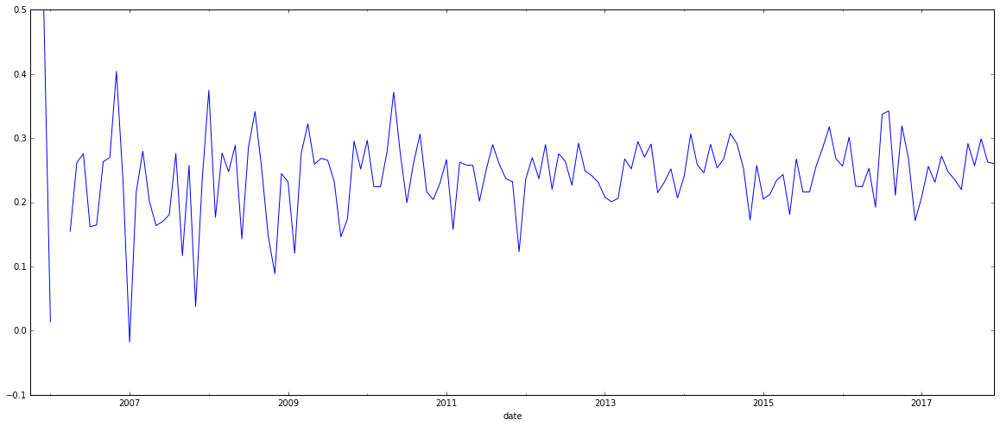

In [242]:
MAG_senti_blob.plot()

In [244]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [245]:
sid = SentimentIntensityAnalyzer()
pol_scores_vader = []

for s in MAG_weekly.ix['2011-05-31']:
    ss = sid.polarity_scores(s)
    compound_score = ss['compound']
    pol_scores_vader.append(compound_score)

print(sum(pol_scores_vader) / len(pol_scores_vader))

0.42121617647058823


In [246]:
def vader_senti(text):
    sid = SentimentIntensityAnalyzer()
    pol_scores_vader = []
    mean_score = 0
    for s in text:
        ss = sid.polarity_scores(s)
        compound_score = ss['compound']
        pol_scores_vader.append(compound_score)
    if(len(pol_scores_vader)>0):
        mean_score = sum(pol_scores_vader) / len(pol_scores_vader)
    else:
        mean_score = np.nan
    return(mean_score)

In [247]:
MAG_senti_vader = MAG_weekly.apply(vader_senti)

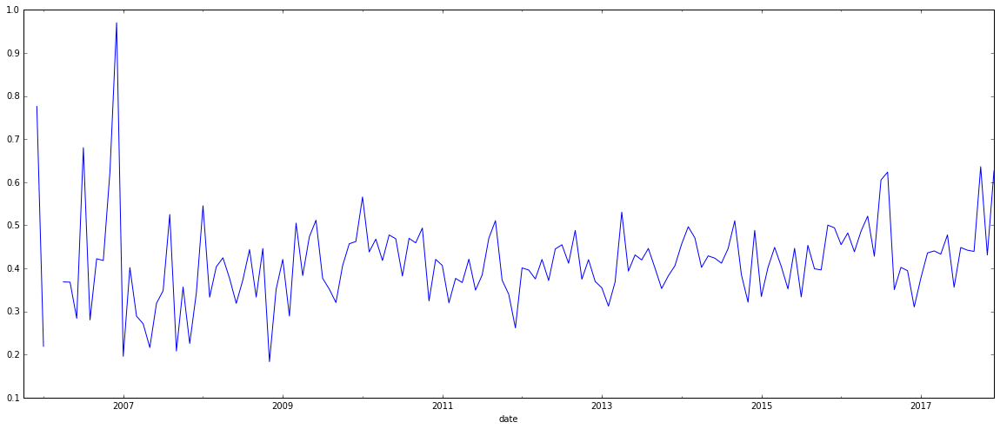

In [248]:
MAG_senti_vader.plot()